# Import first

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import math
import os
from matplotlib import colors
from matplotlib.gridspec import GridSpec
from scipy.spatial.distance import euclidean
from scipy.stats import wilcoxon
from Bio import SeqIO
from gzip import open as gopen
from ete3 import *
from os import path
from Bio import Entrez
from scipy.stats import mannwhitneyu as mwu
from scipy.stats import bartlett
from itertools import combinations, cycle
from statsmodels.stats.multitest import multipletests
from collections import Counter
from IPython.display import Image as IMAGE
#Entrez.email = "amir@adssc.org"

!mkdir Results/Figures
%matplotlib inline

mkdir: cannot create directory ‘Results/Figures’: File exists


# Taxa barplot

### Barplots plotting

In [ ]:
import importlib
importlib.reload(plt); importlib.reload(plt); importlib.reload(sns)

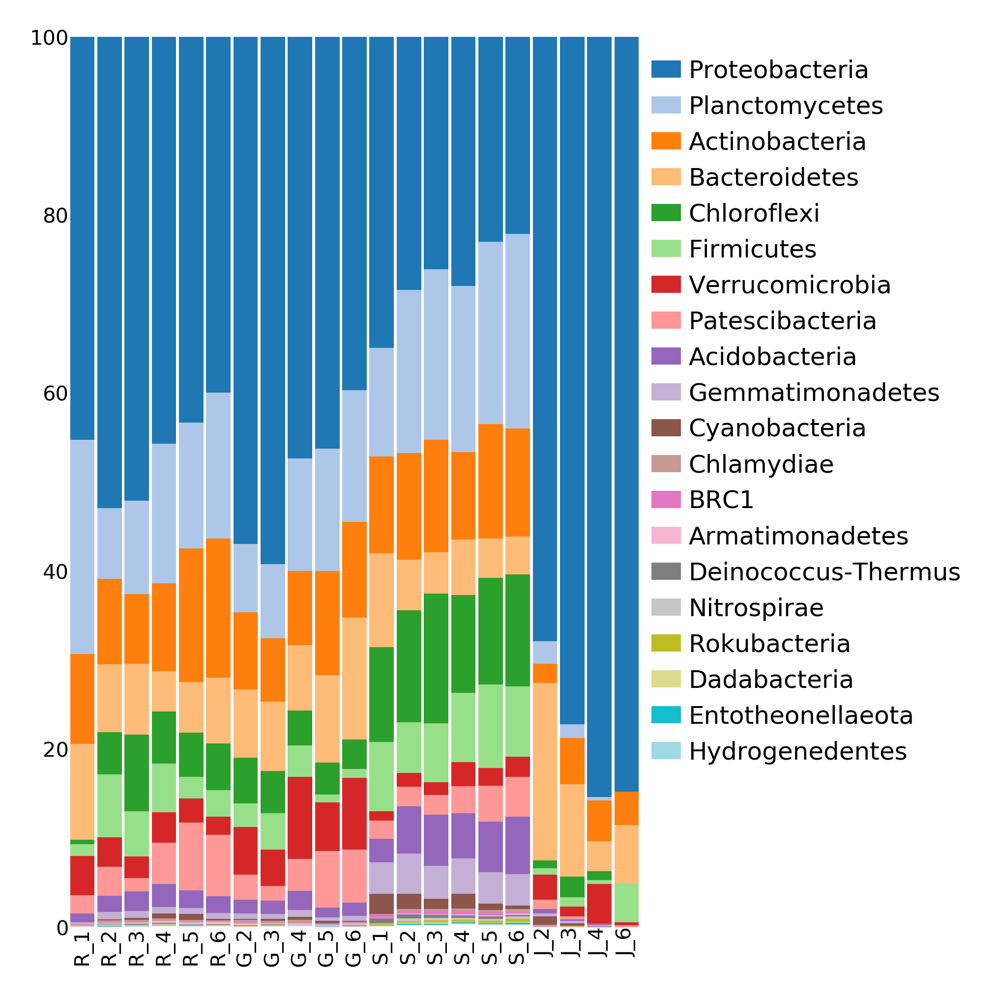

In [4]:
def bar_unzip(qza,lev):  
    a = !unzip $qza
    digest = a[1].split('/')[0].replace('  inflating: ','')
    inf = digest + '/data/level-%s.csv'%lev
    data = pd.read_csv(inf, sep=',',index_col=0)
    !rm -r $digest
    return data
order = ['R_1','R_2','R_3','R_4','R_5','R_6','G_2','G_3','G_4','G_5','G_6',\
         'S_1','S_2','S_3','S_4','S_5','S_6','J_2','J_3','J_4','J_6']
data = bar_unzip('Results/Taxa_barplots/Group_TP_taxabarplot.qzv',2)
data.columns = [col.split('D_1__')[-1] for col in list(data.columns.tolist())]
df = data.loc[:,'Euryarchaeota':'WS2'].copy()
df.columns = [col.split('D_1__')[-1] for col in list(df.columns.tolist())]
df = df.div(df.sum(axis=1), axis=0)*100
df = df.reindex(order)
df = df.append(df.agg(['sum']))
df.sort_values(inplace=True,axis=1,by='sum',ascending=True)
df.drop(inplace=True,index='sum')
fig,ax = plt.subplots(figsize=(2.5,4),dpi=600)
bottom = [0 for i in df.index]
cm = plt.get_cmap('tab20')
toplot = 20
cmap = ['w']*(len(df.columns)-toplot) + [cm(i) for i in range(toplot)][::-1]
for i,col in enumerate(df.columns):
    if i >= len(df.columns)-toplot: label = col
    else: label = None
    ax.bar(x=df.index,height=df[col],bottom=bottom,color=cmap[i],label=label, width=0.9)
    bottom = [x+y for x,y in zip(bottom, df[col].tolist())]
handles, labels = ax.get_legend_handles_labels()
ax.tick_params(axis='both',labelsize=5,pad=0.03,length=0)
ax.tick_params(axis='x',labelrotation=90)
plt.xlim(-0.5,len(df)-.5)
plt.ylim(0,100)
sns.despine(left=True, bottom=True, right=True)
plt.legend(handles[::-1],labels[::-1],loc=1,bbox_to_anchor=(1.6,1),fontsize=6,frameon=False,handletextpad=0.3,handlelength=1.2)
plt.savefig('Results/Figures/barplots/Barplot_alt.png', bbox_inches='tight')

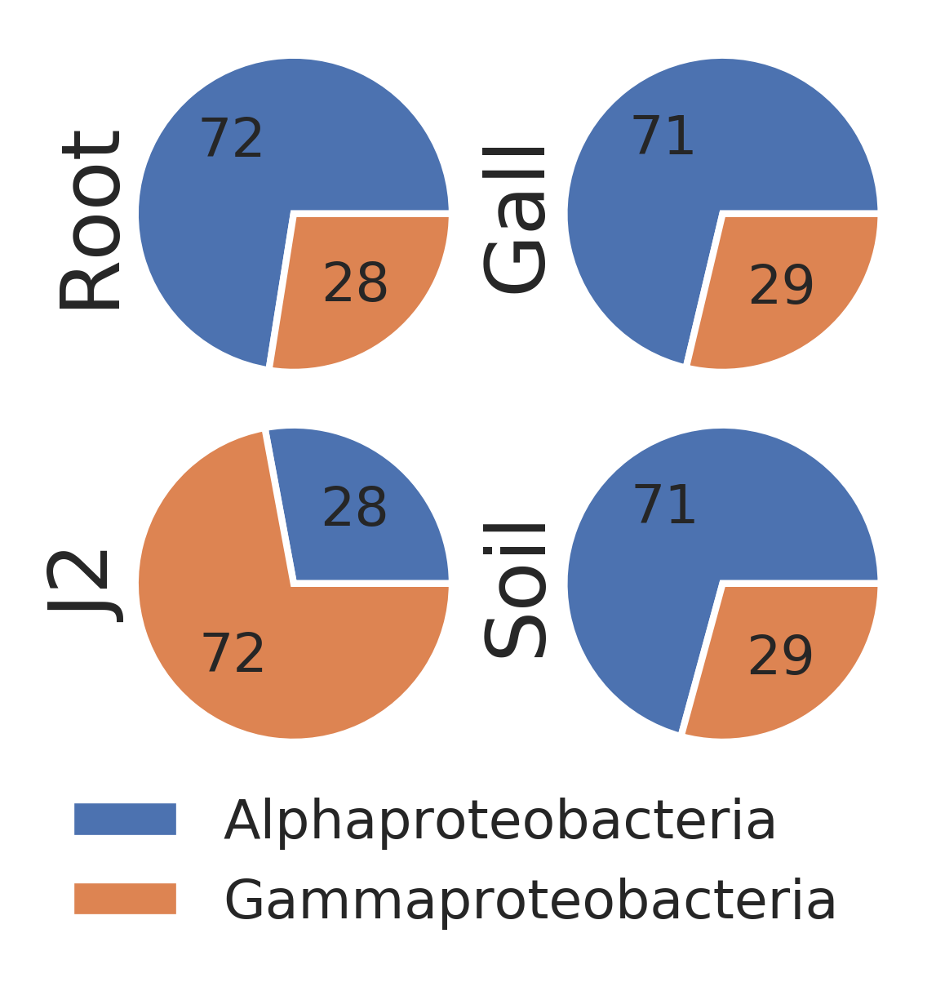

In [338]:
def bar_unzip(qza,lev):  
    a = !unzip $qza
    digest = a[1].split('/')[0].replace('  inflating: ','')
    inf = digest + '/data/level-%s.csv'%lev
    data = pd.read_csv(inf, sep=',',index_col=0)
    !rm -r $digest
    return data
data = bar_unzip('Results/Taxa_barplots/Group_TP_taxabarplot.qzv',3)
data.columns = [col.split('D_2__')[-1] for col in list(data.columns.tolist())]
data = data[['Alphaproteobacteria','Gammaproteobacteria']].copy()
axs = {0:[0,0],1:[0,1],2:[1,0],3:[1,1]}
fig,axes = plt.subplots(2,2,figsize=(2,2),dpi=600,gridspec_kw={'hspace':0,'wspace':0.3})
plt.rcParams['font.size'] = 8.0
for i,niche in enumerate(['Root','Gall','J2','Soil']):
    ax=axes[axs[i][0]][axs[i][1]]
    df = data[data.index.str.contains(niche[:1])].copy()
    df = df.append(df.agg(['mean']))
    df = df.loc['mean']
    ax.pie(data=df,x=[df.Alphaproteobacteria.tolist(),df.Gammaproteobacteria.tolist()],radius=1.2,autopct='%1.0f',)
    ax.set_ylabel(niche,labelpad=0)
plt.legend(loc=0,bbox_to_anchor=(1,0),fontsize=8,frameon=False,labels = ['Alphaproteobacteria','Gammaproteobacteria'])
plt.savefig('Results/Figures/barplots/Barplot_Proteobacteria.png', bbox_inches='tight')

## Statistic analysis of top 10 features in barplots

In [8]:
def bar_unzip(qza,lev):  
    a = !unzip $qza
    digest = a[1].split('/')[0].replace('  inflating: ','')
    inf = digest + '/data/level-%s.csv'%lev
    data = pd.read_csv(inf, sep=',',index_col=0)
    !rm -r $digest
    return data

def relative(df):
    cols = [col for col in df.columns if 'D_1__' in col]
    df = df.loc[:,cols]
    df.columns = [col.split('D_1__')[-1] for col in df.columns]
    df = df.loc[:, (df.sum(axis=0) != 0)]
    df = df.div(df.sum(axis=1), axis=0)*100
    df = df.append(df.agg(['mean']))
    df.sort_values(inplace=True,axis=1,by='mean',ascending=False)
    df.drop(inplace=True,index='mean')
    return df
        
data = bar_unzip('Results/Taxa_barplots/Infected_taxabarplot.qzv',2)
ceilmean = relative(bar_unzip('Results/Taxa_barplots/Niche_taxabarplot.qzv',2))

# Root vs Gall
r_df,g_df = relative(data.loc[data.Niche=='Root'].copy()),relative(data.loc[data.Niche=='Gall'].copy())
cols = list(set(r_df.columns.tolist()[0:10]+g_df.columns.tolist()[0:10]))
mwu_results = pd.DataFrame(columns=['ceil-mean_root','ceil-mean_gall','u','p'])
for col in cols:
    root,gall = r_df[col].tolist(),g_df[col].tolist()
    u, p = mwu(root,gall)
    mwu_results.loc[col] = [ceilmean.at['Root',col],ceilmean.at['Gall',col],u,p]   
mwu_results['q'] = multipletests(mwu_results.p,method='fdr_bh')[1]
mwu_results['p'] = round(mwu_results['p'],4)
mwu_results['q'] = round(mwu_results['q'],4)
mwu_results.sort_values(inplace=True,axis=0,by='ceil-mean_root',ascending=False)
mwu_results.to_csv('Results/Taxa_barplots/Root_vs_Gall_top10.csv')
display(mwu_results)

# Within Niche
niches = list(set(data['Niche']))
mwu_results = pd.DataFrame(columns=['Niche','feature1','feature2','ceil-mean1','ceil-mean2','u','p'])
for niche in niches:
    df = relative(data.loc[data.Niche==niche].copy())
    cols = df.columns.tolist()[0:10]
    for pair in combinations(cols,2):
        feat1,feat2 = df[pair[0]].tolist(),df[pair[1]].tolist()
        u, p = mwu(feat1,feat2)
        mean1,mean2  = ceilmean.at[niche,pair[0]],ceilmean.at[niche,pair[1]]
        mwu_results.loc[len(mwu_results)]=[niche,pair[0],pair[1],mean1,mean2,u,p]          
mwu_results['q'] = multipletests(mwu_results.p,method='fdr_bh')[1]
mwu_results['p'] = round(mwu_results['p'],4)
mwu_results['q'] = round(mwu_results['q'],4)
mwu_results.to_csv('Results/Taxa_barplots/Features_within_Niche_top10.csv')
display(mwu_results)

,ceil-mean_root,ceil-mean_gall,u,p,q
Proteobacteria,42.784771,44.474804,1896.0,0.0555,0.0706
Planctomycetes,15.925408,13.423263,1661.0,0.0042,0.0141
Actinobacteria,12.469308,10.222043,1722.0,0.0091,0.0227
Bacteroidetes,7.294483,10.584445,1442.0,0.0002,0.0008
Patescibacteria,5.743590,5.467671,2230.0,0.4534,0.4534
Chloroflexi,5.044289,4.012310,2106.0,0.2529,0.2810
Firmicutes,3.412587,1.863783,1741.0,0.0113,0.0227
Verrucomicrobia,2.896659,6.494478,1023.0,0.0000,0.0000
Acidobacteria,2.156954,1.656696,1803.0,0.0225,0.0375
Gemmatimonadetes,0.814297,0.690290,1898.0,0.0565,0.0706


,Niche,feature1,feature2,ceil-mean1,ceil-mean2,u,p,q
0,J2,Proteobacteria,Bacteroidetes,74.815413,12.680477,0.0,0.0,0.0
1,J2,Proteobacteria,Actinobacteria,74.815413,3.874092,0.0,0.0,0.0
2,J2,Proteobacteria,Verrucomicrobia,74.815413,1.733776,0.0,0.0,0.0
3,J2,Proteobacteria,Planctomycetes,74.815413,1.826443,0.0,0.0,0.0
4,J2,Proteobacteria,Firmicutes,74.815413,1.611216,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
175,Soil,Acidobacteria,Patescibacteria,5.052640,3.410840,6432.0,0.0,0.0
176,Soil,Acidobacteria,Verrucomicrobia,5.052640,1.974265,3933.0,0.0,0.0
177,Soil,Gemmatimonadetes,Patescibacteria,3.685842,3.410840,6415.0,0.0,0.0
178,Soil,Gemmatimonadetes,Verrucomicrobia,3.685842,1.974265,2845.0,0.0,0.0


# Beta diversity
## PCoA, Biplot and wilcoxon for all samples

In [3]:
def parse_biplot(qza): ### Unzipping qza biplots
    a = !unzip $qza
    digest = a[1].split('/')[0].replace('  inflating: ','')
    inf = digest + '/data/ordination.txt'
    lines = open(inf,'r').readlines()
    Eigvals = [float(i) for i in lines[1].rstrip().split('\t')]
    Proportion = [float(i) for i in lines[4].rstrip().split('\t')]
    biplot_skiprows = 7
    biplot_skipfoot = len(open(inf,'r').read().split('Site')[1].splitlines()) + 1
    pcoa_skiprows = len(open(inf,'r').read().split('Site')[0].splitlines()) + 1
    pcoa_skipfoot = 4
    pcoa = pd.read_csv(inf, index_col=0, skiprows=pcoa_skiprows, skipfooter=pcoa_skipfoot, header=None, sep='\t')
    biplot = pd.read_csv(inf, index_col=0, skiprows=biplot_skiprows, skipfooter=biplot_skipfoot, header=None, sep='\t')
    !rm -r $digest
    return  pcoa, biplot, Eigvals, Proportion

def get_arrow_coords(axis,axis2,num,biplot): ### Geting coordinats for arrows
    arrow_data = []
    origin = np.zeros_like(biplot.columns)
    biplot['importance'] = biplot.apply(euclidean, axis=1, args=(origin,))
    biplot.sort_values('importance', inplace=True, ascending=False)
    for taxon in biplot.index.tolist()[:num].copy():
        arrow_data.append([taxon,biplot.at[taxon,axis],biplot.at[taxon,axis2]])
    return arrow_data

colora = {'%i_tp' % (i+1): sns.color_palette("copper")[::-1][i] for i in range(6)} ### colors
marka = {'R':'v', 'S':'s', 'G' :'o', 'J':'X'}                  ### shapes

def sub():
    for Niche in set(pca_metadata.Group_Treat):
        for TP in set(pca_metadata.TP):
            color = colora[TP]
            marker = marka[Niche]
            size = 5
            data = ordination.loc[ordination.index.isin(pca_metadata.loc[((pca_metadata.Group_Treat == Niche) & (pca_metadata['TP'] == TP))].index)]
            sns.scatterplot(x=x,y=y,data=data,ax=ax,legend=False,color=color,marker=marker,s=size,linewidth=0.01)

# Wilcoxon test for galls and roots in each timepoint
# This is paired data: each plant has a root sample and a gall sample.
# we provide the wilcoxon test with UNIfrac distances between the gall and root communitites of each plant

def distance_matrix(qza):
    a = !unzip $qza
    digest = a[1].split('/')[0].replace('  inflating: ','')
    inf = digest + '/data/distance-matrix.tsv'
    matrix = pd.read_csv(inf,sep='\t',index_col=0)
    !rm -r $digest
    return matrix

# Weighted and unweighted refers to UniFrac
wilcoxon_results = pd.DataFrame(columns=['unweighted_mean_distance','unweighted_pvalue','weighted_mean_distance','weighted_pvalue'])
narrow     = pd.DataFrame(columns = ['UniFrac','tp','distance']) # to collect the individual distances for the plot
unweighted = distance_matrix('Data/Core-metrics_analysis/Infected_Core-metrics/unweighted_unifrac_distance_matrix.qza')
weighted   = distance_matrix('Data/Core-metrics_analysis/Infected_Core-metrics/weighted_unifrac_distance_matrix.qza')
metadata   = pd.read_csv('Metadata/metadata.tsv', sep='\t', index_col=0)

for tp in range(2,7):
    unweighted_distances = []
    weighted_distances = []
    root_gall_infected_lines = metadata.loc[((metadata.Treatment=='Infected') & (metadata.TimePoint==tp))]
    plants = set([i.split('_')[0] for i in root_gall_infected_lines.Location.tolist()])
    for plant in plants:
        if plant+'_G' not in root_gall_infected_lines.Location.tolist() or plant+'_R' not in root_gall_infected_lines.Location.tolist():
            continue
        gall_sample = root_gall_infected_lines.loc[root_gall_infected_lines.Location==plant+'_G'].index.tolist()[0]
        root_sample = root_gall_infected_lines.loc[root_gall_infected_lines.Location==plant+'_R'].index.tolist()[0]
        if gall_sample not in unweighted.index or root_sample not in unweighted.index:
            continue
        unweighted_distances.append(unweighted.at[gall_sample,root_sample])
        weighted_distances.append(weighted.at[gall_sample,root_sample])
        narrow.loc[len(narrow)] = ['unweighted',tp,unweighted.at[gall_sample,root_sample]]
        narrow.loc[len(narrow)] = ['weighted',tp,weighted.at[gall_sample,root_sample]]
    wilcoxon_results.loc[tp] = [np.average(unweighted_distances), wilcoxon(unweighted_distances)[1],
                                np.average(weighted_distances), wilcoxon(weighted_distances)[1]]
    
wilcoxon_results['unweighted_qvalue'] = list(multipletests(wilcoxon_results.unweighted_pvalue, method='fdr_bh'))[1]
wilcoxon_results['weighted_qvalue'] = list(multipletests(wilcoxon_results.weighted_pvalue, method='fdr_bh'))[1]

/home/bio/anaconda3/envs/qiime2-2019.10/lib/python3.6/site-packages/scipy/stats/morestats.py:2863: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")


In [3]:
wilcoxon_results

,unweighted_mean_distance,unweighted_pvalue,weighted_mean_distance,weighted_pvalue,unweighted_qvalue,weighted_qvalue
2,0.410808,0.043114,0.132636,0.043114,0.053893,0.053893
3,0.447306,0.027708,0.200033,0.027708,0.046180,0.046180
4,0.371595,0.067889,0.132801,0.067889,0.067889,0.067889
5,0.428625,0.000655,0.207981,0.000655,0.001637,0.001637
6,0.400334,0.000438,0.243011,0.000438,0.001637,0.001637


/home/bio/anaconda3/envs/qiime2-2019.10/lib/python3.6/site-packages/ipykernel_launcher.py:12: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  if sys.path[0] == '':
/home/bio/anaconda3/envs/qiime2-2019.10/lib/python3.6/site-packages/ipykernel_launcher.py:13: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  del sys.path[0]
/home/bio/anaconda3/envs/qiime2-2019.10/lib/python3.6/site-packages/ipykernel_launcher.py:148: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
/home/bio/anaconda3/envs/qiime2-2019.10/lib/python3.6/site-packages/IPython/core/pylabtools.py:128:

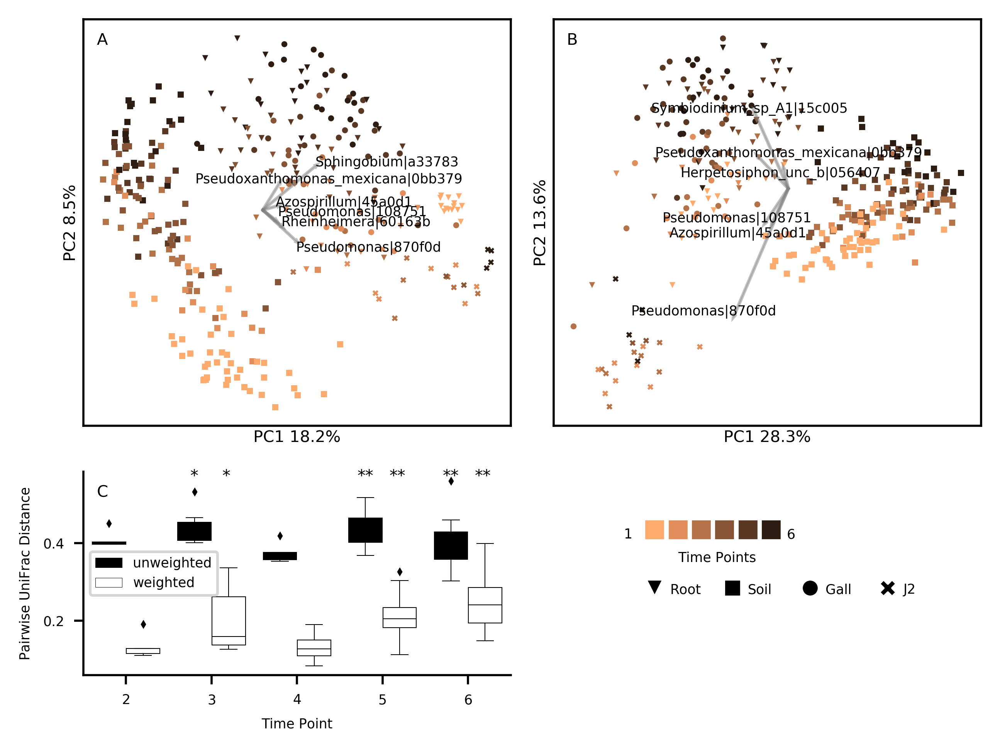

In [8]:
# Creating a scatterplots 2*2*********************************************************
fig=plt.figure(figsize=(6,4.5),constrained_layout=True,dpi=500)
gs = GridSpec(2, 2, width_ratios=[1, 1], height_ratios=[4,2], wspace=0.1, hspace=0.15)
axes = []
biplot_features = set()
z=6 ### Number of features to plot
for ax in gs:
    axes.append(fig.add_subplot(ax))
    
### Unweighted_unifrac ### Scatterplot 1************************************************************************
ax  = axes[0]
qza = 'Data/Core-metrics_analysis/Infected_Core-metrics/unweighted_unifrac_biplot.qza'
ordination, biplot, Eigvals, Proportion = parse_biplot(qza)
metadata = pd.read_csv('Metadata/metadata.tsv', sep='\t', index_col=0)
pca_metadata = metadata.loc[metadata.index.isin(ordination.index)]
x=1 ### axis to show
y=2 ### axis to show
sub()
ys = {}     
arrow_data = get_arrow_coords(x,y,z,biplot)
for arrow in arrow_data:
    arrow_x,text_x = arrow[1],arrow[1]
    arrow_y, text_y = arrow[2], arrow[2]
    for value in ys.values():
        while value-text_y<0 and value-text_y>-0.02:
            text_y+=0.01
        while value-text_y>0 and value-text_y<0.02:
            text_y-=0.01
    ys[arrow[0]]=text_y
    arrow[0]= str(arrow[0])[:-26]
    if arrow[0]=='Pseudoxanthomonas_mexicana|0bb379':
        text_x -= 0.15
    if arrow[0]=='Pseudomonas|870f0d':
        text_y -= 0.015
    if arrow[0]=='Pseudomonas|108751':
        text_y -= 0.015
    ax.arrow(0, 0, arrow_x, arrow_y, fc='gray',ec='gray',alpha=0.5)
    ax.text(text_x, text_y, arrow[0], fontdict={'fontsize': 5})
    biplot_features.add(arrow[0])

ax.tick_params(axis='both', length=0, pad=0)       
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_ylabel('PC%i %.1f%%' % (y, Proportion[y-1]*100.0),fontdict={'fontsize': 6})
ax.set_xlabel('PC%i %.1f%%' % (x, Proportion[x-1]*100.0),fontdict={'fontsize': 6})
ax.annotate("A",xy=(0,1),xycoords="axes fraction",xytext=(5,-5),textcoords="offset points",ha="left",va="top",size=6)
ax.xaxis.set_label_coords(0.5, -0.01)
ax.yaxis.set_label_coords(-0.01, 0.5)
ax.autoscale(enable=True, axis='both', tight=None)

### Weighted_unifrac ### Scatterplot 2************************************************************************
ax  = axes[1] 
qza = 'Data/Core-metrics_analysis/Infected_Core-metrics/weighted_unifrac_biplot.qza'
ordination, biplot, Eigvals, Proportion = parse_biplot(qza)
metadata = pd.read_csv('Metadata/metadata.tsv', sep='\t', index_col=0)
pca_metadata = metadata.loc[metadata.index.isin(ordination.index)]
x=1 ### axis to show
y=2 ### axis to show
sub()
ys = {}     
arrow_data = get_arrow_coords(x,y,z,biplot)
for arrow in arrow_data:
    arrow_x,text_x = arrow[1],arrow[1]
    arrow_y, text_y = arrow[2], arrow[2]
    for value in ys.values():
        while value-text_y<0 and value-text_y>-0.02:
            text_y+=0.01
        while value-text_y>0 and value-text_y<0.02:
            text_y-=0.01
    ys[arrow[0]]=text_y
    arrow[0]= arrow[0][:-26]
    text_x -= 0.15
    ax.arrow(0, 0, arrow_x, arrow_y, fc='gray',ec='gray',alpha=0.5)
    ax.text(text_x, text_y, arrow[0], fontdict={'fontsize': 5})
    biplot_features.add(arrow[0])
    
ax.tick_params(axis='both', length=0, pad=0)        
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_ylabel('PC%i %.1f%%' % (y, Proportion[y-1]*100.0),fontdict={'fontsize': 6})
ax.set_xlabel('PC%i %.1f%%' % (x, Proportion[x-1]*100.0),fontdict={'fontsize': 6})
ax.annotate("B",xy=(0,1),xycoords="axes fraction",xytext=(5,-5),textcoords="offset points",ha="left",va="top",size=6)
ax.xaxis.set_label_coords(0.5, -0.01)
ax.yaxis.set_label_coords(-0.01, 0.5)
ax.autoscale(enable=True, axis='both', tight=None)

### boxplot
ax  = axes[2]
sns.boxplot('tp','distance',hue='UniFrac',data=narrow,ax=ax, palette=['black','white'],fliersize=1,linewidth=0.3)
ax.set_ylabel('Pairwise UniFrac Distance',fontdict={'size':5})
ax.set_xlabel('Time Point',fontdict={'size':5})
for a in ['top','right']: ax.spines[a].set_visible(False)

#ax.text(2.75,0.56,'*',fontdict={'size':8})
#ax.text(3.25,0.56,'*',fontdict={'size':8})
#ax.text(3.75,0.56,'*',fontdict={'size':8})
#ax.text(4.25,0.56,'*',fontdict={'size':8})
for uf in ['unweighted_qvalue','weighted_qvalue']:
    qs = wilcoxon_results[uf].tolist()
    pos = range(len(qs))
    for tick,label in zip(pos,ax.get_xticklabels()):
        ps = pos[tick]
        if uf == 'unweighted_qvalue': ps -= 0.2
        if uf == 'weighted_qvalue':   ps += 0.175
        ast = '*'
        if qs[tick] <= 0.01 and qs[tick] > 0.001:
            ast = '**'
        if qs[tick] <= 0.001:
            ast = '***'
        if qs[tick] <= 0.05:
            ax.text(ps, 0.56, ast, fontdict={'size':6},horizontalalignment='center')

for tick in ax.xaxis.get_major_ticks(): tick.label.set_fontsize(5) 
for tick in ax.yaxis.get_major_ticks(): tick.label.set_fontsize(5) 
ax.legend(prop={'size': 5})
ax.annotate("C",xy=(0,1),xycoords="axes fraction",xytext=(5,-5),textcoords="offset points",ha="left",va="top",size=6)

ax  = axes[3]
x = 0.04
ax.text(x,-0.03,'1',fontdict={'size':5})
x+=0.04
for col in sns.color_palette("copper")[::-1]:
    sns.scatterplot([x],[0],marker='s',color=col,ax=ax,s=60,legend=False)
    x+=0.03
ax.text(x-0.01,-0.03,'6',fontdict={'size':5}) 
x+=0.06
#sns.scatterplot([x],[0],marker='s',color='red',ax=ax,s=60,legend=False)
x+=0.03
#ax.text(x,-0.03,'Control',fontdict={'size':5})
ax.text(0.11,-0.11,'Time Points',fontdict={'size':5})

marks = {'Root':'v', 'Soil':'s', 'Gall':'o', 'J2' :'X'}

x = 0.08
for n in marks.keys():
    sns.scatterplot([x],[-0.2],marker=marks[n],color='black',ax=ax,s=40,legend=False)
    ax.text(x+0.02,-0.22,n,fontdict={'size':5})
    x+=0.1
for a in ['top','bottom','left','right']:
    ax.spines[a].set_visible(False)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlim(-0.05,0.5)
ax.set_ylim(-0.5,0.2)
    
plt.savefig('Results/Figures/Unweighted_Weighted_unifrac_biplots_Infected.png', bbox_inches='tight')

## PCoA and Biplot for galls and roots from time point 2-6
### Run PCoA and Biplot in qiime2

In [ ]:
%%bash
#source activate qiime2-2019.10
mkdir -p Results/Core-metrics_analysis

for i in "5" "6"
do
    echo "time point $i"
    qiime diversity core-metrics-phylogenetic \
      --i-table Data/tables/Root-Gall_${i}_table.qza \
      --p-sampling-depth 8000 \
      --i-phylogeny Data/rooted-tree.qza \
      --m-metadata-file Metadata/metadata.tsv \
      --output-dir Results/Core-metrics_analysis/Root-Gall-${i}_Core-metrics

    qiime feature-table relative-frequency \
     --i-table Data/tables/Root-Gall_${i}_table.qza \
     --o-relative-frequency-table temp.qza 
    
    for j in "unweighted" "weighted"
    do 
        echo $j
        qiime diversity pcoa-biplot \
          --i-pcoa Results/Core-metrics_analysis/Root-Gall-${i}_Core-metrics/${j}_unifrac_pcoa_results.qza \
          --i-features temp.qza \
          --o-biplot Results/Core-metrics_analysis/Root-Gall-${i}_Core-metrics/${j}_unifrac_pcoa_results_biplot.qza

        qiime emperor biplot \
          --i-biplot Results/Core-metrics_analysis/Root-Gall-${i}_Core-metrics/${j}_unifrac_pcoa_results_biplot.qza \
          --m-sample-metadata-file Metadata/metadata.tsv \
          --p-ignore-missing-samples \
          --p-number-of-features 10 \
          --o-visualization Results/Core-metrics_analysis/Root-Gall-${i}_Core-metrics/${j}_unifrac_biplot_emperor.qzv
    done
    rm temp.qza
done

### Plot PCoA-Biplot for timepoint 6

/home/bio/anaconda3/envs/qiime2-2019.10/lib/python3.6/site-packages/ipykernel_launcher.py:12: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  if sys.path[0] == '':
/home/bio/anaconda3/envs/qiime2-2019.10/lib/python3.6/site-packages/ipykernel_launcher.py:13: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  del sys.path[0]


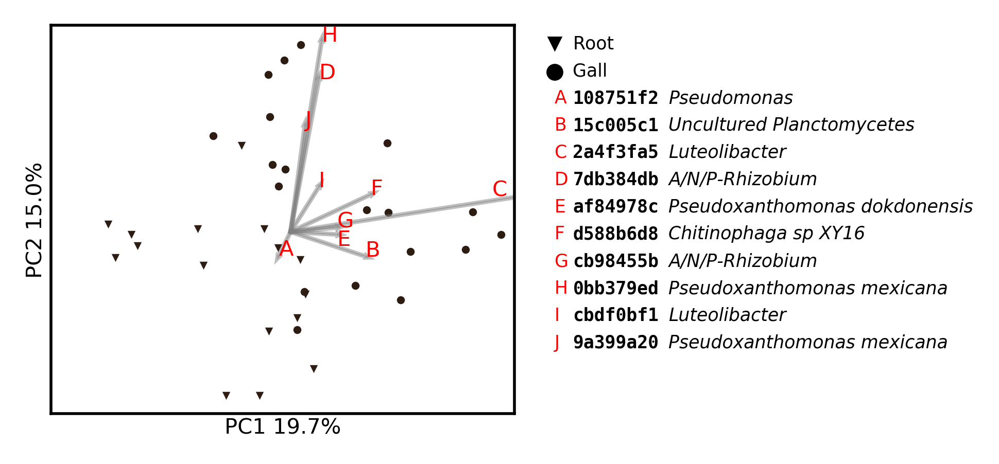

In [5]:
colora = {'%i_tp' % (i+1): sns.color_palette("copper")[::-1][i] for i in range(6)} ### colors
z=10 ### Number of features to plot

fig=plt.figure(figsize=(3.25,2),constrained_layout=True,dpi=500)
fig.set_constrained_layout_pads(w_pad=0, h_pad=0)
gs = GridSpec(1, 2, width_ratios=[3, 1], wspace=0.1)
axes = []
biplot_features = set()

for ax in gs:
    axes.append(fig.add_subplot(ax))
ax = axes[0]
qza = 'Results/Core-metrics_analysis/Root-Gall-6_Core-metrics/weighted_unifrac_pcoa_results_biplot.qza'
ordination, biplot, Eigvals, Proportion = parse_biplot(qza)
metadata = pd.read_csv('Metadata/metadata.tsv', sep='\t', index_col=0)
pca_metadata = metadata.loc[metadata.index.isin(ordination.index)]
x=1 ### axis to show
y=2 ### axis to show
sub()

arrow_data = get_arrow_coords(x,y,z,biplot)
arrow_labels_legend = {}

letter = 'a'
for arrow in arrow_data:
    arrow_x,text_x = arrow[1],arrow[1]
    arrow_y, text_y = arrow[2], arrow[2]
    if 'Luteolibacter|2a4f' in arrow[0]:
        text_x -= 0.03
    if 'dokdonensis' in arrow[0]:
        text_y -= 0.01
    ax.arrow(0, 0, arrow_x, arrow_y, fc='gray',ec='gray',alpha=0.5)
    arrow_labels_legend[letter.upper()] = arrow[0][:-24]
    ax.text(text_x, text_y, letter.upper(), fontdict={'fontsize': 6, 'color':'red'})
    letter = chr(ord(letter) + 1)
    biplot_features.add(arrow[0])

ax.tick_params(axis='both', length=0, pad=0)       
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_ylabel('PC%i %.1f%%' % (y, Proportion[y-1]*100.0),fontdict={'fontsize': 6})
ax.set_xlabel('PC%i %.1f%%' % (x, Proportion[x-1]*100.0),fontdict={'fontsize': 6})
ax.xaxis.set_label_coords(0.5, -0.01)
ax.yaxis.set_label_coords(-0.01, 0.5)
ax.autoscale(enable=True, axis='both', tight=None)
ax.set_xlim(-0.225,0.21)

ax = axes[1]
ax.tick_params(axis='both', length=0, pad=0)       
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_ylim(0,1)
ax.set_xlim(0,0.25)

legend = sorted(list(arrow_labels_legend.items()))
y = 0.95

for i in [['v','Root'],['o','Gall']]:
    sns.scatterplot([0.015],[y],marker=i[0],color='black',ax=ax,s=30,legend=False)
    ax.text(0.045,y-0.01,i[1],fontdict={'size':5})
    y -= 0.07
for i in legend:
    ax.text(0.015,y-0.01,i[0],fontdict={'size':5,'color':'red'})
    asv = i[1]
    ax.text(0.045,y-0.01,asv.split('|')[-1],fontdict={'size':5,'family':'monospace','weight':'semibold'})
    tax = ' '.join(asv.replace('Allorhizobium-Neorhizobium-Pararhizobium','A/N/P').replace('_',' ')\
                   .replace('Symbiodinium sp A1','Uncultured Planctomycetes').split('|')[:-1])
    ax.text(0.2,y-0.01,tax,fontdict={'size':5,'style':'italic'})
    y -= 0.07

for a in ['top','bottom','left','right']:
    ax.spines[a].set_visible(False)
plt.savefig('Results/Figures/Weighted_unifrac_biplots_tp6_root_gall.png', bbox_inches='tight')

# Alpha and beta diversity  

### Alpha-rarefaction curve

/home/bio/anaconda3/envs/qiime2-2019.10/lib/python3.6/site-packages/ipykernel_launcher.py:16: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()


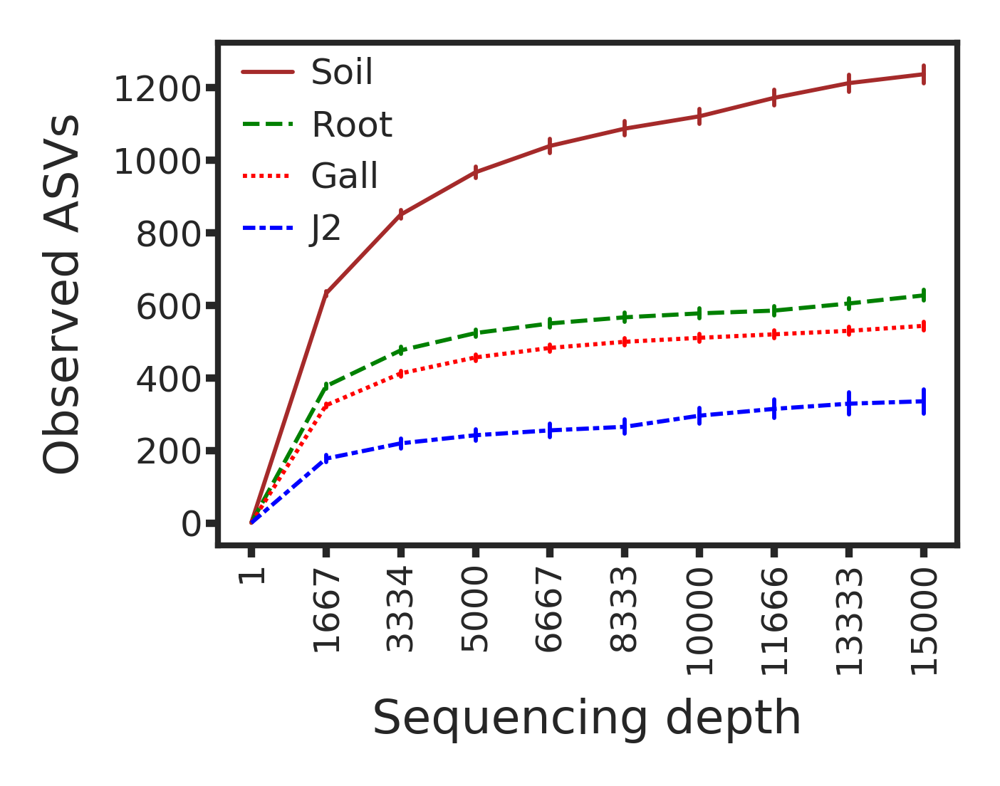

In [4]:
qza = 'Results/Core-metrics_analysis/Infected_alpha-rarefaction.qzv'
a = !unzip $qza
digest = a[1].split('/')[0].replace('  inflating: ','')
inf = digest + '/data/observed_otus.csv'
otus = pd.read_csv(inf,index_col=0, sep=',')
!rm -r $digest

cols = [col for col in otus.columns if 'iter' not in col]
mean,data = otus[cols],pd.DataFrame(columns=cols)
depths = [col.split('_')[0] for col in otus.columns if 'depth' in col]
otus = otus.drop(cols,axis=1)
otus.columns = depths
for depth in depths:
    mean['ASV'] = otus[depth].mean(axis=1)
    mean['depth']= depth.split('-')[-1]
    data = pd.concat([data,mean])
pal={'Soil':'brown','Root':'green','J2':'blue','Gall':'red'}
fig,ax = plt.subplots(figsize=(2.5,2),dpi=600,tight_layout=True)
sns.set(style='ticks',rc={"lines.linewidth":0.7,"axes.linewidth":0.5})
sns.lineplot(x='depth',y='ASV',data=data,palette=pal,hue='Niche',sort=False,err_style='bars',dashes=True,style='Niche')
ax.set_xlabel('Sequencing depth',fontsize=8)
ax.set_ylabel('Observed ASVs',fontsize=8)
ax.tick_params(axis='x', labelrotation=90)
ax.tick_params(axis='both',which='major',length=2,pad=0.5,labelsize=6)
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[1:],labels=labels[1:],fontsize=6,frameon=False,numpoints=4,borderaxespad=0,handletextpad=0.2,loc=2,)
plt.savefig('Results/Figures/Infected_observed_ASVs.png', bbox_inches='tight')

### Alpha-group-sign

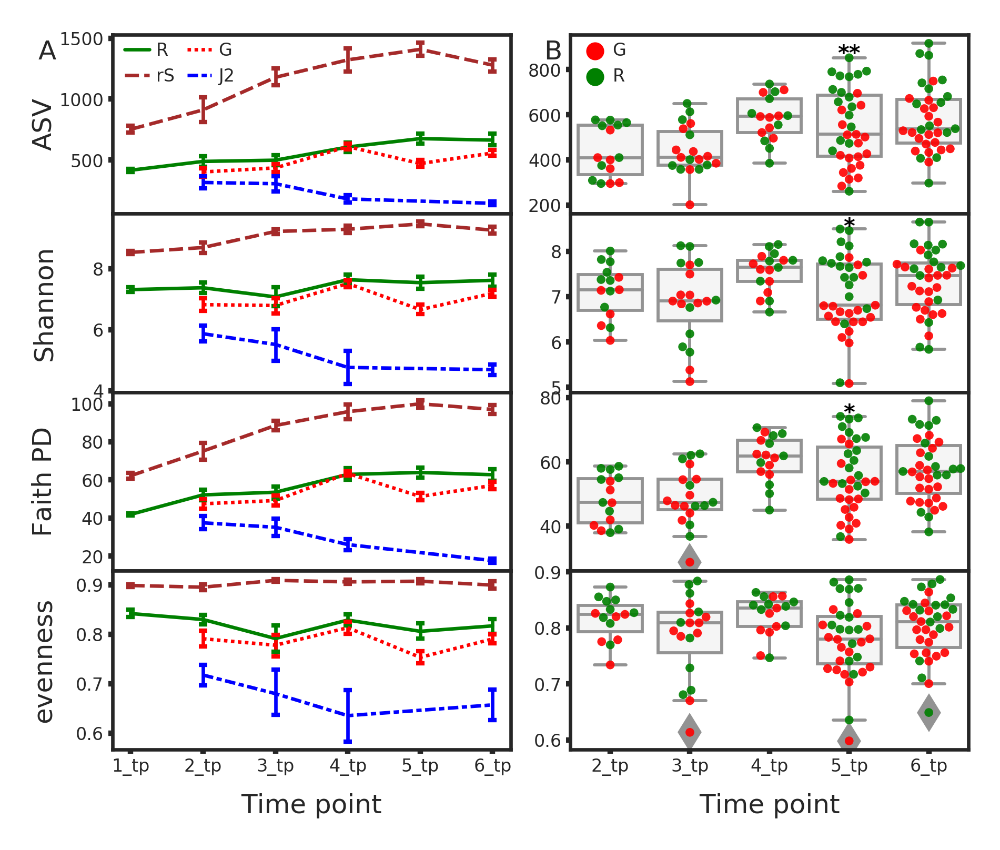

In [2]:
def alpha_div(qza):  
    a = !unzip $qza
    digest = a[1].split('/')[0].replace('  inflating: ','')
    inf = digest + '/data/metadata.tsv'
    alpha = pd.read_csv(inf, sep='\t', skiprows=[1])
    !rm -r $digest
    return alpha 
lab = {'Root':'R', 'Soil':'rS', 'Gall':'G', 'J2':'J2'}
sns.set(style='ticks',rc={"lines.linewidth":0.8,"axes.linewidth":0.8})
fig, axes = plt.subplots(4,2,dpi=600,figsize=(3.5,3),gridspec_kw={'hspace': 0,'wspace': 0.15})
axs, i = {0:[0,0],1:[1,0],2:[2,0],3:[3,0],4:[0,1],5:[1,1],6:[2,1],7:[3,1]}, 0
ylabels = ['ASV','Shannon','Faith PD', 'evenness'] + ['']*4
alpha_diversity = ['observed_otus', 'shannon', 'faith_pd', 'evenness']
alpha = alpha_div('Results/Core-metrics_analysis/Infected_Core-metrics/%s_vector_alpha-group-sign.qzv'%alpha_diversity[0])
alpha = alpha[['Niche', 'TP']]
for alp in alpha_diversity:
    vector = 'Results/Core-metrics_analysis/Infected_Core-metrics/%s_vector_alpha-group-sign.qzv' % alp
    metric = alp
    if alp == 'evenness': metric = 'pielou_e'
    alpha_df = alpha_div(vector)
    alpha = pd.concat([alpha, alpha_df[metric]], axis=1)
pal={'Soil':'brown','Root':'green','J2':'blue','Gall':'red'}
order=['1_tp','2_tp','3_tp','4_tp','5_tp','6_tp']
alpha = alpha.loc[alpha['TP'].isin(order)].sort_values('TP')
for alp in ['observed_otus','shannon','faith_pd','evenness']:
    metric = alp
    if alp == 'evenness': metric = 'pielou_e'
    ax=axes[axs[i][0]][axs[i][1]]
    sns.lineplot(y=metric,x='TP',data=alpha,ax=ax,hue='Niche',err_style="bars",err_kws={'capsize':1},\
                 palette=pal,dashes=True,style='Niche',ci=67)
    ax.tick_params(axis='both', which='major', labelsize=4, length=1, pad=1)
    ax.set_ylabel(ylabels[i],fontsize=6,labelpad=0.5)
    ax.set_xlabel('Time point',fontsize=6)
    handles, labels = ax.get_legend_handles_labels()
    labels = [l if l not in lab.keys() else lab[l] for l in labels]
    ax.legend(loc=0,borderaxespad=0,handletextpad=0.1,fontsize=4,frameon=False,numpoints=2,\
              handles=handles[1:],labels=labels[1:],markerscale=0.5,ncol=2,columnspacing=0.4)
    if i != 0: ax.legend().remove()
    i += 1
ax.annotate('A',xy=(-0.22,4),xycoords="axes fraction",xytext=(3,-1),textcoords="offset points",ha="left",va="top",size=6)
fig.align_ylabels(axes[:4])

# Alpha diversity Gall-Root Kruskal-Wallis pairwise comparissons
order,  hue_order = ['G/R_2','G/R_3','G/R_4','G/R_5','G/R_6'], ['Gall','Root']
for alp in ['observed_otus','shannon','faith_pd','evenness']:
    qza = 'Results/Core-metrics_analysis/Root-Gall_Core-metrics/%s_vector_alpha-group-sign.qzv'%alp
    a = !unzip $qza
    digest = a[1].split('/')[0].replace('  inflating: ','')
    meta = pd.read_csv(digest+'/data/metadata.tsv', sep='\t', skiprows=[1])
    alpha= pd.read_csv(digest+'/data/kruskal-wallis-pairwise-Group_TP.csv', sep=',')
    !rm -r $digest
    alpha['Groups'] = alpha['Group 1'].str.split(' ').str[0]+'-'+alpha['Group 2'].str.split(' ').str[0]
    alpha = alpha[alpha['Groups'].str.contains('G_2-R_2|G_3-R_3|G_4-R_4|G_5-R_5|G_6-R_6')]
    meta  = meta[meta['TP'].str.contains('2_tp|3_tp|4_tp|5_tp|6_tp')]
    for tp in range(2,7): meta.loc[meta['TP'].str.contains(str(tp)),'Groups'] = 'G_%s-R_%s'%(tp,tp)
    index = alp
    if index == 'evenness': index = 'pielou_e'
    ax=axes[axs[i][0]][axs[i][1]]
    data = meta.copy()
    data['Groups'] = data['Groups'].str[0:1] + '/' + data['Groups'].str[4:]
    sns.boxplot(x='Groups',y=index,data=data,order=order,ax=ax,color='whitesmoke',linewidth=0.7,saturation=0.5)
    sns.swarmplot(x='Groups',y=index,data=data,hue='Niche',hue_order=hue_order,order=order,ax=ax,\
                  palette=['red','green'],size=2,alpha=0.9)
    ax.set_ylabel(ylabels[i],fontsize=6)
    ax.set_xlabel('Time point',fontsize=6)
    ax.set_xticklabels(['2_tp','3_tp','4_tp','5_tp','6_tp'])
    ax.tick_params(axis='both', which='major', labelsize=4, length=1, pad=1)
    handles, labels = ax.get_legend_handles_labels()
    labels = [l if l not in lab.keys() else lab[l] for l in labels]
    ax.legend(loc=0,labels=labels,handles=handles,borderaxespad=0,handletextpad=0,fontsize=4,frameon=False,markerscale=0.4)
    qs = alpha['q-value'].tolist()
    maxs = data.groupby(['Groups'])[index].max().values
    pos = range(len(qs))
    for tick,label in zip(pos,ax.get_xticklabels()):
        ast = '*'
        if qs[tick] <= 0.01 and qs[tick] > 0.001: ast = '**'
        if qs[tick] <= 0.001: ast = '***'
        if qs[tick] <= 0.05:
            ax.text(pos[tick], maxs[tick]*0.99, ast, horizontalalignment='center', size=5, color='black', weight='semibold')
    alpha.to_csv('Results/Core-metrics_analysis/Root-Gall_Core-metrics/%s_alpha-group-sign.tsv'%alp,sep='\t',index=False)
    if i != 4: ax.legend().remove()
    i += 1
ax.annotate('B',xy=(-0.1,4),xycoords="axes fraction",xytext=(3,-1),textcoords="offset points",ha="left",va="top",size=6)
plt.savefig('Results/Figures/Alpha_Volatility_and_G-R_test.png', bbox_inches='tight')

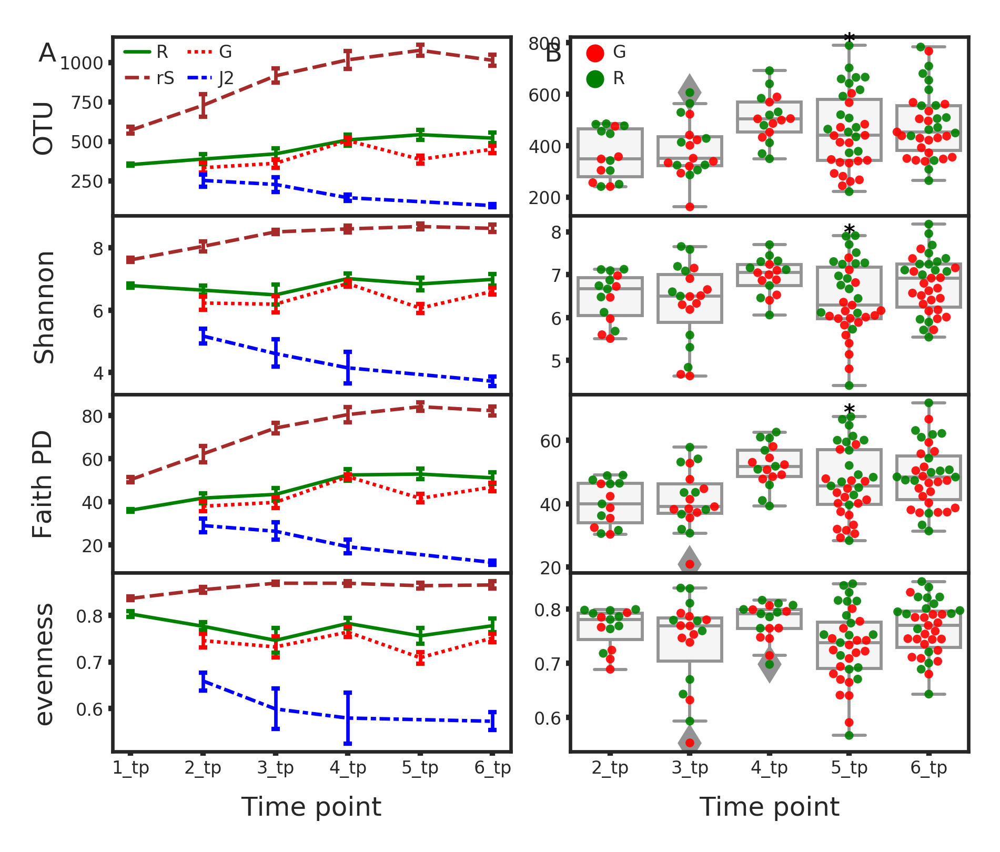

In [3]:
# With OTUs
def alpha_div(qza):  
    a = !unzip $qza
    digest = a[1].split('/')[0].replace('  inflating: ','')
    inf = digest + '/data/metadata.tsv'
    alpha = pd.read_csv(inf, sep='\t', skiprows=[1])
    !rm -r $digest
    return alpha 
lab = {'Root':'R', 'Soil':'rS', 'Gall':'G', 'J2':'J2'}
sns.set(style='ticks',rc={"lines.linewidth":0.8,"axes.linewidth":0.8})
fig, axes = plt.subplots(4,2,dpi=600,figsize=(3.5,3),gridspec_kw={'hspace': 0,'wspace': 0.15})
axs, i = {0:[0,0],1:[1,0],2:[2,0],3:[3,0],4:[0,1],5:[1,1],6:[2,1],7:[3,1]}, 0
ylabels = ['OTU','Shannon','Faith PD', 'evenness'] + ['']*4
alpha_diversity = ['observed_otus', 'shannon', 'faith_pd', 'evenness']
alpha = alpha_div('Results/Core-metrics_analysis_97-OTU/Infected_Core-metrics/%s_vector_alpha-group-sign.qzv'%alpha_diversity[0])
alpha = alpha[['Niche', 'TP']]
for alp in alpha_diversity:
    vector = 'Results/Core-metrics_analysis_97-OTU/Infected_Core-metrics/%s_vector_alpha-group-sign.qzv' % alp
    metric = alp
    if alp == 'evenness': metric = 'pielou_e'
    alpha_df = alpha_div(vector)
    alpha = pd.concat([alpha, alpha_df[metric]], axis=1)
pal={'Soil':'brown','Root':'green','J2':'blue','Gall':'red'}
order=['1_tp','2_tp','3_tp','4_tp','5_tp','6_tp']
alpha = alpha.loc[alpha['TP'].isin(order)].sort_values('TP')
for alp in ['observed_otus','shannon','faith_pd','evenness']:
    metric = alp
    if alp == 'evenness': metric = 'pielou_e'
    ax=axes[axs[i][0]][axs[i][1]]
    sns.lineplot(y=metric,x='TP',data=alpha,ax=ax,hue='Niche',err_style="bars",err_kws={'capsize':1},\
                 palette=pal,dashes=True,style='Niche',ci=67)
    ax.tick_params(axis='both', which='major', labelsize=4, length=1, pad=1)
    ax.set_ylabel(ylabels[i],fontsize=6,labelpad=0.5)
    ax.set_xlabel('Time point',fontsize=6)
    handles, labels = ax.get_legend_handles_labels()
    labels = [l if l not in lab.keys() else lab[l] for l in labels]
    ax.legend(loc=0,borderaxespad=0,handletextpad=0.1,fontsize=4,frameon=False,numpoints=2,\
              handles=handles[1:],labels=labels[1:],markerscale=0.5,ncol=2,columnspacing=0.4)
    if i != 0: ax.legend().remove()
    i += 1
ax.annotate('A',xy=(-0.22,4),xycoords="axes fraction",xytext=(3,-1),textcoords="offset points",ha="left",va="top",size=6)
fig.align_ylabels(axes[:4])

# Alpha diversity Gall-Root Kruskal-Wallis pairwise comparissons
order,  hue_order = ['G/R_2','G/R_3','G/R_4','G/R_5','G/R_6'], ['Gall','Root']
for alp in ['observed_otus','shannon','faith_pd','evenness']:
    qza = 'Results/Core-metrics_analysis_97-OTU/Root-Gall_Core-metrics/%s_vector_alpha-group-sign.qzv'%alp
    a = !unzip $qza
    digest = a[1].split('/')[0].replace('  inflating: ','')
    meta = pd.read_csv(digest+'/data/metadata.tsv', sep='\t', skiprows=[1])
    alpha= pd.read_csv(digest+'/data/kruskal-wallis-pairwise-Group_TP.csv', sep=',')
    !rm -r $digest
    alpha['Groups'] = alpha['Group 1'].str.split(' ').str[0]+'-'+alpha['Group 2'].str.split(' ').str[0]
    alpha = alpha[alpha['Groups'].str.contains('G_2-R_2|G_3-R_3|G_4-R_4|G_5-R_5|G_6-R_6')]
    meta  = meta[meta['TP'].str.contains('2_tp|3_tp|4_tp|5_tp|6_tp')]
    for tp in range(2,7): meta.loc[meta['TP'].str.contains(str(tp)),'Groups'] = 'G_%s-R_%s'%(tp,tp)
    index = alp
    if index == 'evenness': index = 'pielou_e'
    ax=axes[axs[i][0]][axs[i][1]]
    data = meta.copy()
    data['Groups'] = data['Groups'].str[0:1] + '/' + data['Groups'].str[4:]
    sns.boxplot(x='Groups',y=index,data=data,order=order,ax=ax,color='whitesmoke',linewidth=0.7,saturation=0.5)
    sns.swarmplot(x='Groups',y=index,data=data,hue='Niche',hue_order=hue_order,order=order,ax=ax,\
                  palette=['red','green'],size=2,alpha=0.9)
    ax.set_ylabel(ylabels[i],fontsize=6)
    ax.set_xlabel('Time point',fontsize=6)
    ax.set_xticklabels(['2_tp','3_tp','4_tp','5_tp','6_tp'])
    ax.tick_params(axis='both', which='major', labelsize=4, length=1, pad=1)
    handles, labels = ax.get_legend_handles_labels()
    labels = [l if l not in lab.keys() else lab[l] for l in labels]
    ax.legend(loc=0,labels=labels,handles=handles,borderaxespad=0,handletextpad=0,fontsize=4,frameon=False,markerscale=0.4)
    qs = alpha['q-value'].tolist()
    maxs = data.groupby(['Groups'])[index].max().values
    pos = range(len(qs))
    for tick,label in zip(pos,ax.get_xticklabels()):
        ast = '*'
        if qs[tick] <= 0.01 and qs[tick] > 0.001: ast = '**'
        if qs[tick] <= 0.001: ast = '***'
        if qs[tick] <= 0.05:
            ax.text(pos[tick], maxs[tick]*0.99, ast, horizontalalignment='center', size=5, color='black', weight='semibold')
    alpha.to_csv('Results/Core-metrics_analysis/Root-Gall_Core-metrics/%s_alpha-group-sign.tsv'%alp,sep='\t',index=False)
    if i != 4: ax.legend().remove()
    i += 1
ax.annotate('B',xy=(-0.1,4),xycoords="axes fraction",xytext=(3,-1),textcoords="offset points",ha="left",va="top",size=6)
plt.savefig('Results/Figures/Alpha_Volatility_and_G-R_test-OTUs.png', bbox_inches='tight')

### Beta_Group_TP-dist-matrix_beta-group-sign-pairwise

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
/home/bio/anaconda3/envs/qiime2-2019.4/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "
/home/bio/anaconda3/envs/qiime2-2019.4/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


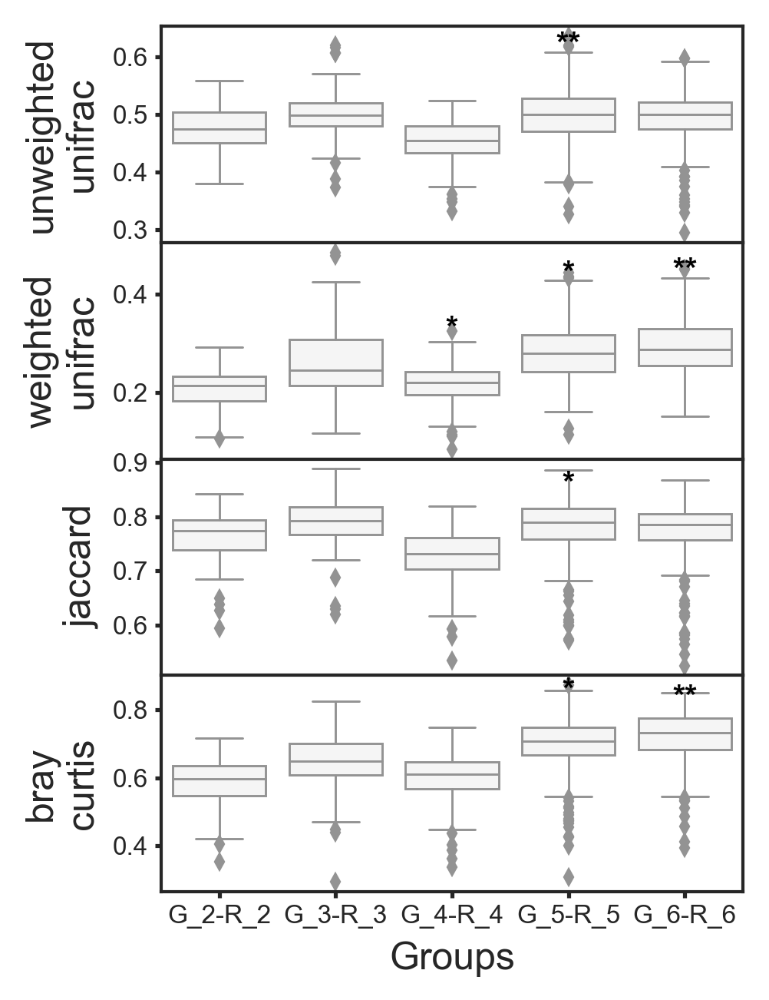

In [11]:
# Beta Gall-Root Permanova pairwise comparissons
order = ['G_2-R_2','G_3-R_3','G_4-R_4','G_5-R_5','G_6-R_6']
hue_order = ['Gall','Root']
i=0
fig, axes = plt.subplots(nrows=4,dpi=300,figsize=(3.5,4.5),tight_layout=True,gridspec_kw={'hspace': 0})
beta_diversity = ['unweighted_unifrac','weighted_unifrac','jaccard','bray_curtis']
for B in beta_diversity:
    qza = 'Results/Core-metrics_analysis/Root-Gall_Core-metrics/%s_Group_TP-dist-matrix_beta-group-sign-pairwise.qzv'%B
    a = !unzip $qza
    digest = a[1].split('/')[0].replace('  inflating: ','')
    meta = pd.read_csv(digest+'/data/raw_data.tsv', sep='\t')
    beta = pd.read_csv(digest+'/data/permanova-pairwise.csv', sep=',')
    !rm -r $digest
    beta['Groups'] = beta['Group 1']+'-'+beta['Group 2']
    beta = beta[beta['Groups'].str.contains('G_2-R_2|G_3-R_3|G_4-R_4|G_5-R_5|G_6-R_6')]
    meta['Groups'] = meta['Group1']+'-'+meta['Group2']
    meta = meta[meta['Groups'].str.contains('G_2-R_2|G_3-R_3|G_4-R_4|G_5-R_5|G_6-R_6')]
    ax=axes[i]
    sns.boxplot(x='Groups',y='Distance',data=meta,order=order,ax=ax,color='whitesmoke',linewidth=0.7,fliersize=3)
    ax.tick_params(axis='both', which='major', labelsize=8, length=2, pad=2)
    ax.legend(bbox_to_anchor=(1, 1), loc=0, borderaxespad=0,handletextpad=0,fontsize='xx-small',frameon=False)
    ax.set_ylabel(B.replace('_','\n'))
    qs = beta['q-value'].tolist()
    maxs = meta.groupby(['Groups'])['Distance'].max().values
    pos = range(len(qs))
    for tick,label in zip(pos,ax.get_xticklabels()):
        m=maxs[tick]-maxs[tick]/20
        ast = '*'
        if qs[tick] <= 0.01 and qs[tick] > 0.001:
            ast = '**'
        if qs[tick] <= 0.001:
            ast = '***'
        if qs[tick] <= 0.05:
            ax.text(pos[tick], m, ast, horizontalalignment='center', size='small', color='black', weight='semibold')
    beta.to_csv('Results/Core-metrics_analysis/Root-Gall_Core-metrics/%s_Group_TP-dist-matrix_beta-group-sign-pairwise.tsv' % B, sep='\t', index = False)
    i+=1
fig.align_ylabels(axes[:4])
plt.savefig('Results/Figures/Beta_Group_TP-dist-matrix_beta-group-sign-pairwise.png', bbox_inches='tight')


# Core features

In [1]:
# By groups
outdir= 'Results/Core_Features'
groups = ['S_2','S_3','S_4','S_6',
          'R_2','R_3','R_4','R_6',
          'G_2','G_3','G_4','G_6',
          'J_2','J_3','J_4','J_6']

!mkdir $outdir
for group in groups:
    tabin  = 'Data/tables/Infected_table.qza'
    column = "Group_TP='%s'"            % group
    tabout = 'Data/tables/%s_table.qza' % group

    !qiime feature-table filter-samples \
        --i-table $tabin \
        --m-metadata-file Metadata/metadata.tsv \
        --p-where "$column" \
        --o-filtered-table $tabout
     
    table_7= 'Data/tables/%s_7-lev_table.qza'  % group
    core_7 = outdir+'/%s_7-lev_core.qzv'       % group
    coreqzv= outdir+'/%s_core.qzv'             % group

    !qiime taxa collapse \
        --i-table $tabout \
        --i-taxonomy Data/combo_taxonomy.qza \
        --p-level 7 \
        --o-collapsed-table $table_7
    !qiime feature-table core-features \
        --i-table $table_7 \
        --o-visualization $core_7
    !qiime feature-table core-features \
        --i-table $tabout \
        --o-visualization $coreqzv

Saved FeatureTable[Frequency] to: Data/tables/S_2_table.qza
mkdir: missing operand
Try 'mkdir --help' for more information.
Saved FeatureTable[Frequency] to: Data/tables/S_2_7-lev_table.qza
Saved Visualization to: Results/Core_Features/S_2_7-lev_core.qzv
Saved Visualization to: Results/Core_Features/S_2_core.qzv
Saved FeatureTable[Frequency] to: Data/tables/S_3_table.qza
mkdir: missing operand
Try 'mkdir --help' for more information.
Saved FeatureTable[Frequency] to: Data/tables/S_3_7-lev_table.qza
Saved Visualization to: Results/Core_Features/S_3_7-lev_core.qzv
Saved Visualization to: Results/Core_Features/S_3_core.qzv
Saved FeatureTable[Frequency] to: Data/tables/S_4_table.qza
mkdir: missing operand
Try 'mkdir --help' for more information.
Saved FeatureTable[Frequency] to: Data/tables/S_4_7-lev_table.qza
Saved Visualization to: Results/Core_Features/S_4_7-lev_core.qzv
Saved Visualization to: Results/Core_Features/S_4_core.qzv
Saved FeatureTable[Frequency] to: Data/tables/S_6_table.qz

## Core-features_tables

In [ ]:
# By Niches and TimePoints separately 
import pandas as pd
outdir= 'Results/Core_Features'
groups = ['S_2','S_3','S_4','S_6',
          'R_2','R_3','R_4','R_6',
          'G_2','G_3','G_4','G_6',
          'J_2','J_3','J_4','J_6']

for group in groups:
    temp = 'Data/Core_%s_temp' % group
    coreqzv = 'Results/Core_Features/%s_core.qzv' % group
    !mkdir $temp
    !qiime tools export \
        --input-path $coreqzv \
        --output-path $temp

    temp_7 = 'Data/Core_%s_temp_7' % group
    core_7 = 'Results/Core_Features/%s_7-lev_core.qzv' % group
    !mkdir $temp_7
    !qiime tools export \
        --input-path $core_7 \
        --output-path $temp_7

Root, Gall, Soil, J2 = pd.DataFrame(), pd.DataFrame(), pd.DataFrame(), pd.DataFrame()
for group in groups:
    temp = 'Data/Core_%s_temp' % group
    core_tsv= temp+'/core-features-1.000.tsv' 
    core_pd = pd.read_csv(core_tsv, sep='\t')
    core_pd = core_pd.filter(['Feature ID'], axis = 1)
    core_pd.columns = [group]
    if 'S' in group: Soil = pd.concat([Soil, core_pd], axis = 1)
    if 'R' in group: Root = pd.concat([Root, core_pd], axis = 1)
    if 'G' in group: Gall = pd.concat([Gall, core_pd], axis = 1)
    if 'J' in group: J2 = pd.concat([J2, core_pd], axis = 1)
    !rm -r $temp
        
Soil.to_csv('Results/Core_Features/Soil_tp.tsv', sep='\t')
Root.to_csv('Results/Core_Features/Root_tp.tsv', sep='\t')
Gall.to_csv('Results/Core_Features/Gall_tp.tsv', sep='\t')
J2.to_csv('Results/Core_Features/J2_tp.tsv', sep='\t')

Root, Gall, Soil, J2 = pd.DataFrame(), pd.DataFrame(), pd.DataFrame(), pd.DataFrame()
for group in groups:
    temp_7 = 'Data/Core_%s_temp_7' % group
    core_tsv= temp_7+'/core-features-1.000.tsv' 
    core_pd = pd.read_csv(core_tsv, sep='\t')
    core_pd = core_pd.filter(['Feature ID'], axis = 1)
    core_pd.columns = [group]
    if 'S' in group: Soil = pd.concat([Soil, core_pd], axis = 1)
    if 'R' in group: Root = pd.concat([Root, core_pd], axis = 1)
    if 'G' in group: Gall = pd.concat([Gall, core_pd], axis = 1)
    if 'J' in group: J2 = pd.concat([J2, core_pd], axis = 1)
    !rm -r $temp_7
        
Soil.to_csv('Results/Core_Features/Soil_tp_lev-7.tsv', sep='\t')
Root.to_csv('Results/Core_Features/Root_tp_lev-7.tsv', sep='\t')
Gall.to_csv('Results/Core_Features/Gall_tp_lev-7.tsv', sep='\t')
J2.to_csv('Results/Core_Features/J2_tp_lev-7.tsv', sep='\t')

## Core ASV/Taxa ratios

In [28]:
niches, tps = ['Soil', 'Root', 'Gall', 'J2'], [2,3,4,6]
ASV_All = {'Soil_2':[], 'Root_2':[], 'Gall_2':[], 'J2_2':[],
           'Soil_3':[], 'Root_3':[], 'Gall_3':[], 'J2_3':[],
           'Soil_4':[], 'Root_4':[], 'Gall_4':[], 'J2_4':[],
           'Soil_6':[], 'Root_6':[], 'Gall_6':[], 'J2_6':[]}
Tax_All = {i:[] for i in list(ASV_All.keys())}
ASV_Unique = {i:[] for i in list(ASV_All.keys())}
Tax_Unique = {i:[] for i in list(Tax_All.keys())}

for niche in niches:
    core_ASV = pd.read_csv('Results/Core_Features/%s_tp.tsv' % niche, sep='\t', index_col=0)
    core_Tax = pd.read_csv('Results/Core_Features/%s_tp_lev-7.tsv' % niche, sep='\t', index_col=0)
    for tp in tps:
        item = niche+'_'+str(tp)
        ASV_All[item] += [a for a in core_ASV[niche[:1]+'_'+str(tp)].tolist() if a == a]
        Tax_All[item] += [t for t in core_Tax[niche[:1]+'_'+str(tp)].tolist() if t == t]

for niche in niches:
    for tp in tps:
        item = niche+'_'+str(tp)
        temp_asv = []
        for k in ASV_All.keys():
            if item != k and '_'+str(tp) in k:
                temp_asv += ASV_All[k]
        ASV_Unique[item] += list(set(ASV_All[item]).difference(temp_asv))
        temp_tax = []
        for k in Tax_All.keys():
            if item != k and '_'+str(tp) in k:
                temp_tax += Tax_All[k]
        Tax_Unique[item] += list(set(Tax_All[item]).difference(temp_tax))
        
ASV_data, ASV_count = pd.DataFrame(), pd.DataFrame()
Tax_data, Tax_count = pd.DataFrame(), pd.DataFrame()
for niche in niches:
    ASV_data[niche+'_All'], ASV_count[niche+'_All'] = [None]*4, [None]*4
    ASV_data[niche+'_Unique'], ASV_count[niche+'_Unique'] = [None]*4, [None]*4
    Tax_data[niche+'_All'], Tax_count[niche+'_All'] = [None]*4, [None]*4
    Tax_data[niche+'_Unique'], Tax_count[niche+'_Unique'] = [None]*4, [None]*4
    for i,tp in enumerate(tps):
        key = niche + '_' + str(tp)
        ASV_data.loc[i,niche+'_All']     = ASV_All[key]
        ASV_count.loc[i,niche+'_All']    = len(ASV_All[key])
        ASV_data.loc[i,niche+'_Unique']  = ASV_Unique[key]
        ASV_count.loc[i,niche+'_Unique'] = len(ASV_Unique[key])
        Tax_data.loc[i,niche+'_All']     = Tax_All[key]
        Tax_count.loc[i,niche+'_All']    = len(Tax_All[key])
        Tax_data.loc[i,niche+'_Unique']  = Tax_Unique[key]
        Tax_count.loc[i,niche+'_Unique'] = len(Tax_Unique[key])

ASV_data.to_csv('Results/Core_Features/Core_ASV_data.tsv',sep='\t')
ASV_count.to_csv('Results/Core_Features/Core_ASV_count.tsv',sep='\t')
Tax_data.to_csv('Results/Core_Features/Core_Taxa_data.tsv',sep='\t')
Tax_count.to_csv('Results/Core_Features/Core_Taxa_count.tsv',sep='\t')

In [4]:
### filter to genera
from ast import literal_eval
a = !unzip Data/combo_taxonomy.qza
digest = a[1].split('/')[0].replace('  inflating: ','')
inf = digest + '/data/taxonomy.tsv'
taxon = pd.read_csv(inf,index_col=0,sep='\t')
!rm -r $digest
ASVs = pd.read_csv('Results/Core_Features/Core_ASV_data.tsv', sep='\t',index_col=0)
Taxa = pd.read_csv('Results/Core_Features/Core_Taxa_data.tsv',sep='\t',index_col=0)
countASVs = pd.read_csv('Results/Core_Features/Core_ASV_count.tsv', sep='\t',index_col=0)
countTaxa = pd.read_csv('Results/Core_Features/Core_Taxa_count.tsv',sep='\t',index_col=0)
Taxa_filt, ASVs_filt, taxa_del, asv_del = Taxa.copy(),ASVs.copy(),[],[]
for ind in Taxa.index.tolist():
    for col in Taxa.columns.tolist():
        temp = []
        lst = literal_eval(Taxa.at[ind,col])
        for t in lst:
            if 'D_5__' not in t: taxa_del.append(t.split(';__')[0])
            else: temp.append(t)
        Taxa_filt.at[ind,col] = temp
        countTaxa.at[ind,col] = len(temp)
for ind in taxon.index:
    if taxon.at[ind,'Taxon'] in taxa_del:
        asv_del.append(ind)
for ind in ASVs.index.tolist():
    for col in ASVs.columns.tolist():
        lst = literal_eval(ASVs.at[ind,col])
        temp = [a for a in lst if a not in asv_del]
        ASVs_filt.at[ind,col] = temp
        countASVs.at[ind,col] = len(temp)
ASVs_filt.to_csv('Results/Core_Features/Core_ASV_data_filt.tsv',  sep='\t')
countASVs.to_csv('Results/Core_Features/Core_ASV_count_filt.tsv', sep='\t')
Taxa_filt.to_csv('Results/Core_Features/Core_Taxa_data_filt.tsv', sep='\t')
countTaxa.to_csv('Results/Core_Features/Core_Taxa_count_filt.tsv',sep='\t')

## Tree distances

In [2]:
# Convert biom table and read metadata
qza = 'Data/tables/Infected_table.qza'
a = !unzip $qza
digest = a[1].split('/')[0].replace('  inflating: ','')
inf = digest + '/data/feature-table.biom'
outf = 'temp.%s' % digest
a = !biom convert -i $inf -o $outf --to-tsv
biom = pd.read_csv(outf,skiprows=1,index_col=0,sep='\t')
!rm -r $digest
!rm $outf 
biom = biom.div(biom.sum(axis=0), axis=1)

metadata = pd.read_csv('Metadata/metadata.tsv',sep='\t',index_col=0)

In [3]:
# Create a database from silva
silva = 'Silva'
!mkdir $silva
#!wget https://www.arb-silva.de/fileadmin/silva_databases/current/Exports/SILVA_138_SSURef_NR99_tax_silva.fasta.gz -P Silva
!zcat Silva/SILVA_138_SSURef_NR99_tax_silva.fasta.gz | makeblastdb -out Silva/silva -dbtype nucl -title silva

mkdir: cannot create directory ‘Silva’: File exists


Building a new DB, current time: 02/20/2020 12:37:50
New DB name:   /home/bio/Dropbox/2018/Silva/silva
New DB title:  silva
Sequence type: Nucleotide
Keep MBits: T
Maximum file size: 1000000000B
Adding sequences from FASTA; added 510984 sequences in 11.9864 seconds.


In [4]:
# create a dictionaries from representative and reference sequences
repseqs = 'Data/combo_rep-seqs.qza'
a = !unzip $repseqs
digest = a[1].split('/')[0].replace('  inflating: ','')
with open(digest+'/data/dna-sequences.fasta') as inf:
    reseqs = SeqIO.to_dict(SeqIO.parse(inf,'fasta'))
    
!rm -r $digest
refs = SeqIO.to_dict(SeqIO.parse(gopen('Silva/SILVA_138_SSURef_NR99_tax_silva.fasta.gz',mode='rt'),'fasta'))

In [5]:
# Create trees and a table with distances
results = pd.DataFrame(columns=['niche','taxon','asv1','asv2','treedist'])
for niche in ['Gall','Root','Soil','J2']:
    print(niche)
    core = pd.read_csv('Results/Core_Features/%s_tp.tsv' % niche,sep='\t',index_col=0) # path in original dir
    taxa = {}
    for col in core:
        for i in core[col]:
            if isinstance(i,float):
                continue
            taxon, digest = i.split('|')
            if taxon not in taxa:
                taxa[taxon] = set()
            taxa[taxon].add(i)
    for taxon in taxa:
        if (taxon in ['metagenome','Alphaproteobacteria_unc','Bacillus_niabensis','Pseudoxanthomonas_mexicana'] or 
            taxon.endswith('ales_unc') or taxon.endswith('ales') or 
            taxon.endswith('eae') or taxon.endswith('eae') or 
            taxon.endswith('eae_unc')):
            continue
        if len(taxa[taxon]) > 1:
            runid = niche+'_core_'+taxon.replace('/','_').replace(' ','_').replace('(','').replace(')','')
            if not path.exists('RAxML_bestTree.%s' % runid):
                with open('queries.fasta','wt') as hndl:
                    for asv in taxa[taxon]:
                        hndl.write(reseqs[asv].format('fasta'))
                !blastn -query queries.fasta -out blast.out -outfmt 6 -max_hsps 1 -max_target_seqs 50 -db Silva/silva
                blast = pd.read_csv('blast.out',sep='\t',header=None)
                blast = set([i for i in blast[1]])
                with open('sequences.fasta','wt') as hndl:
                    for i in blast:
                        hndl.write(refs[i].format('fasta'))
                    for key in taxa[taxon]:
                        asv_id = [k for k in list(reseqs.keys()) if key in k][0]
                        r = reseqs[asv_id]
                        r.id = r.id.replace('(','').replace(')','')
                        hndl.write(r.format('fasta'))
                !mafft --maxiterate 1000 --localpair --thread 14 sequences.fasta > sequences.aln.fasta
                !trimal -in sequences.aln.fasta -out sequences.trm.fasta -gt 0.1
                !raxmlHPC-PTHREADS -s sequences.trm.fasta -n $runid -m GTRGAMMA -p 456 -T 10
            t = Tree('RAxML_bestTree.%s' % runid)
            t.set_outgroup(t.get_midpoint_outgroup())
            print(' '+taxon)
            asv_list = list(taxa[taxon])
            for i in range(len(asv_list)):
                asv1 = asv_list[i].replace('(','').replace('(','')
                for j in range(i+1,len(asv_list)):
                    asv2 = asv_list[j].replace('(','')
                    print(' ',asv_list[i].split('|')[1][:8], asv_list[j].split('|')[1][:8], t.get_distance(asv1,asv2))
                    results.loc[len(results)] = [niche,taxon,asv_list[i].split('|')[1][:8],asv_list[j].split('|')[1][:8], t.get_distance(asv1,asv2)]
            !rm blast.out
            !rm sequences.fasta
            !rm sequences.aln.fasta
            !rm sequences.trm.fasta
results.to_csv('Results/Core_Features/Core_Distances.tsv',sep='\t')  
!rm RAxML*
!rm queries.fasta
!rm -r Silva

Gall

generating a scoring matrix for nucleotide (dist=200) ... done
All-to-all alignment.
tbfast-pair (nuc) Version 7.310 alg=L, model=DNA200 (2), 2.00 (6.00), -0.10 (-0.30), noshift, amax=0.0
14 thread(s)

Loading 'hat3.seed' ... 
done.
Writing hat3 for iterative refinement
generating a scoring matrix for nucleotide (dist=200) ... done
Gap Penalty = -1.53, +0.00, +0.00
treein = 0
compacttree = 0
Constructing a UPGMA tree ... 
   50 / 57
done.

Progressive alignment ... 
STEP    33 /56 (thread   11) c
Reallocating (by thread 7) ..done. *alloclen = 4000
STEP    56 /56 (thread    3) c
done.
tbfast (nuc) Version 7.310 alg=A, model=DNA200 (2), 1.53 (4.59), -0.00 (-0.00), noshift, amax=0.0
14 thread(s)

minimumweight = 0.000010
autosubalignment = 0.000000
nthread = 10
randomseed = 0
blosum 62 / kimura 200
poffset = 0
niter = 16
sueff_global = 0.100000
Loading 'hat3' ... done.
generating a scoring matrix for nucleotide (dist=200) ... done

   50 / 57
Segment   1/  1    1-1559
002-0110-1 (th

## Plot ASV/Taxa ratio and tree distances

/home/bio/anaconda3/envs/qiime2-2019.10/lib/python3.6/site-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Gall v.s. J2: Custom statistical test, , P_val=2.279e-02
Soil v.s. Root: Custom statistical test, , P_val=2.279e-02
Root v.s. J2: Custom statistical test, , P_val=2.279e-02
Soil v.s. J2: Custom statistical test, , P_val=2.279e-02
  niche1 niche2  mean_ratio1  mean_ratio2    u         p         q
0   Gall   Root     0.629856     0.649220  7.0  0.442617  0.442617
1   Gall     J2     0.629856     1.232562  0.0  0.015191  0.022787
2   Gall   Soil     0.629856     0.500465  4.0  0.156161  0.187393
3   Root     J2     0.649220     1.232562  0.0  0.015191  0.022787
4   Root   Soil     0.649220     0.500465  0.0  0.015191  0.022787
5     J2   Soil     1.232562     0.500465  0.0  0.015191  0.022787


/home/bio/anaconda3/envs/qiime2-2019.10/lib/python3.6/site-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Gall v.s. J2: Custom statistical test, , P_val=2.279e-02
Soil v.s. Root: Custom statistical test, , P_val=2.279e-02
Soil v.s. Gall: Custom statistical test, , P_val=2.279e-02
Soil v.s. J2: Custom statistical test, , P_val=2.279e-02


No handles with labels found to put in legend.


  niche1 niche2  mean_ratio1  mean_ratio2    u         p         q
0   Gall   Root     1.215487     1.500000  5.5  0.280682  0.280682
1   Gall     J2     1.215487     2.058100  0.0  0.015191  0.022787
2   Gall   Soil     1.215487     0.643236  0.0  0.015191  0.022787
3   Root     J2     1.500000     2.058100  2.0  0.056176  0.067411
4   Root   Soil     1.500000     0.643236  0.0  0.015191  0.022787
5     J2   Soil     2.058100     0.643236  0.0  0.015191  0.022787
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Soil v.s. J2: Custom statistical test, , P_val=1.398e-02
Root v.s. J2: Custom statistical test, , P_val=1.398e-02
Gall v.s. J2: Custom statistical test, , P_val=8.599e-03
  niche1 niche2   median1   median2       u         p         q
0   Gall   Root  0.184096  0.179435  1302.0  0.327649  0.327649
1   Gall   Soil  0.184096  0.230889   476.0  0.313126  0.327649
2   

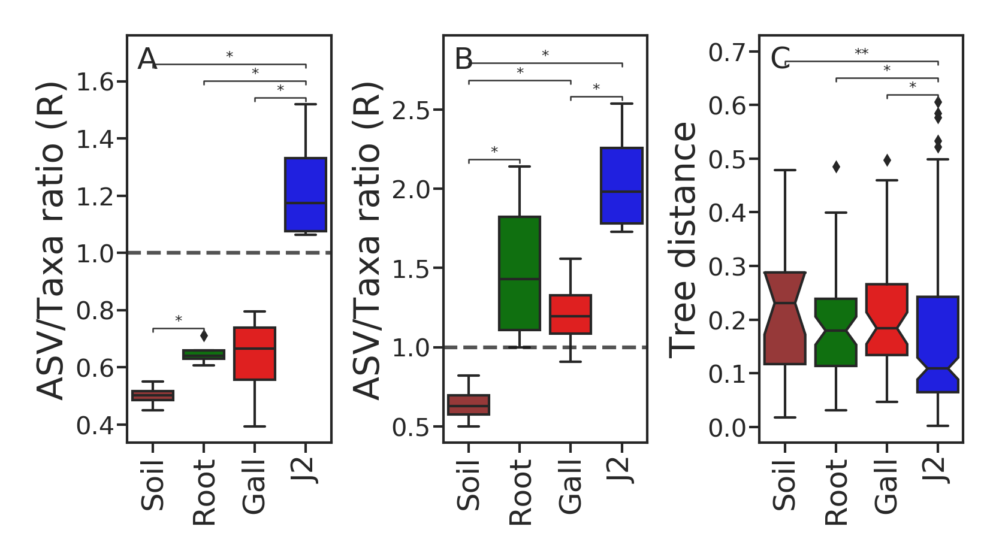

In [4]:
from scipy.stats import mannwhitneyu as mwu
from scipy.stats import wilcoxon
from statsmodels.stats.multitest import multipletests
from numpy import average
from itertools import combinations
from statannot import add_stat_annotation

#barplot of core features observed
Len_all_df  = pd.read_csv('Results/Core_Features/Core_ASV_count.tsv', sep='\t')
Len_all_df7 = pd.read_csv('Results/Core_Features/Core_Taxa_count.tsv',sep='\t')
bars = pd.DataFrame()
cols = [col for col in Len_all_df.columns.tolist() if '-' not in col]
for col in cols: bars[col] = Len_all_df[col]/Len_all_df7[col]
data=pd.DataFrame(columns = ['Feature','Niche'])
for col in bars.columns.tolist():
    sub = pd.DataFrame()
    sub['Feature'] = bars[col]
    sub['Niche']= col
    data = pd.concat([data, sub])

results = pd.read_csv('Results/Core_Features/Core_Distances.tsv',sep='\t',index_col=0)
sns.set(style='ticks',rc={"lines.linewidth":0.5,"axes.linewidth":0.5})

### plot
fig, axes = plt.subplots(1,3,figsize=(3,1.5),dpi=600,gridspec_kw={'wspace': 0.55})
subs,annots=['All','Unique',None],['A','B','C']
hue = {'Soil':'brown','Root':'green','Gall':'red','J2':'blue'}
for i,s in enumerate(subs):
    ax=axes[i]
    if i<2:
        subdata = data[data['Niche'].str.contains(s)]
        subdata['Niche']=subdata['Niche'].str.replace('_All','').str.replace('_Unique','')
        sns.boxplot(x='Niche',y='Feature',data=subdata,ax=ax,order=list(hue.keys()),palette=hue,fliersize=0.5)
        ax.axhline(1, c='k', linestyle='--', lw=0.75, alpha=0.75)
        ax.set_ylabel('ASV/Taxa ratio (R)',fontsize=7,labelpad=1)
    else:
        sns.boxplot(x='niche',y='treedist',data=results,order=list(hue.keys()),palette=hue,notch=True,ax=ax,fliersize=0.5)
        ax.set_ylabel('Tree distance',fontsize=7,labelpad=1)
    ax.tick_params(axis='y',labelsize=5,length=2,pad=0.5,width=0.5)
    ax.tick_params(axis='x',labelrotation=90,labelsize=6,length=2,pad=0.5,width=0.5)
    ax.set_xlabel('')
    ax.annotate(annots[i],xy=(0,1),xycoords="axes fraction",xytext=(2,-2),textcoords="offset points",ha="left",va="top",size=6)
    ax.legend(frameon=False,fontsize=6)
### stats
    niches = list(set(subdata['Niche']))
    if i < 2:
        mwu_results = pd.DataFrame(columns=['niche1','niche2','mean_ratio1','mean_ratio2','u','p'])
        for pair in combinations(niches,2):
            niche1_ratios = subdata.loc[subdata.Niche==pair[0]]['Feature'].tolist()
            niche2_ratios = subdata.loc[subdata.Niche==pair[1]]['Feature'].tolist()
            u, p = mwu(niche1_ratios,niche2_ratios)
            mean1,mean2  = average(niche1_ratios),average(niche2_ratios)
            mwu_results.loc[len(mwu_results)]=[pair[0],pair[1],mean1,mean2,u, p]          
        mwu_results['q'] = multipletests(mwu_results.p,method='fdr_bh')[1]
    else:
        mwu_results = pd.DataFrame(columns=['niche1','niche2','median1','median2','u','p'])
        for pair in combinations(['Gall','Root','Soil','J2'],2):
            u, p = mwu(results.loc[results.niche==pair[0]]['treedist'],results.loc[results.niche==pair[1]]['treedist'])
            median1 = results.loc[results.niche==pair[0]]['treedist'].squeeze().median()
            median2 = results.loc[results.niche==pair[1]]['treedist'].squeeze().median()
            mwu_results.loc[len(mwu_results)]=[pair[0],pair[1],median1,median2,u, p]
        mwu_results['q'] = multipletests(mwu_results.p,method='fdr_bh')[1]
### annotations
    x, y, df = 'Niche', 'Feature', subdata.copy()
    if i == 2: x, y, df = 'niche', 'treedist', results.copy()
    qs = {(mwu_results.iloc[j]['niche1'],mwu_results.iloc[j]['niche2']):q for j,q in enumerate(mwu_results['q']) if q < 0.05}
    add_stat_annotation(ax,data=df,x=x,y=y,box_pairs=list(qs.keys()),pvalues=list(qs.values()),linewidth=0.3,line_height=0.01,\
    fontsize=3,text_format='star',loc='inside',perform_stat_test=False,text_offset=0,line_offset=0,line_offset_to_box=0.01,)
    print(mwu_results)
#fig.text(0.5, -0.05, 'Niche', ha='center',fontsize=8)
#fig.text(-0.01, 0.5, 'ASV/Taxa ratio', va='center', rotation='vertical',fontsize=8)
plt.savefig('Results/Figures/Core_features_unique-shared.png', bbox_inches='tight')

/home/timyerg/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Soil v.s. Root: Custom statistical test, P_val:2.279e-02
Gall v.s. J2: Custom statistical test, P_val:2.279e-02
Root v.s. J2: Custom statistical test, P_val:2.279e-02
Soil v.s. J2: Custom statistical test, P_val:2.279e-02


/home/timyerg/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
No handles with labels found to put in legend.


  niche1 niche2  mean_ratio1  mean_ratio2    u         p         q
0   Root   Soil     0.673661     0.512057  0.0  0.015191  0.022787
1   Root     J2     0.673661     1.284615  0.0  0.015191  0.022787
2   Root   Gall     0.673661     0.678580  5.0  0.235243  0.235243
3   Soil     J2     0.512057     1.284615  0.0  0.015191  0.022787
4   Soil   Gall     0.512057     0.678580  4.0  0.156161  0.187393
5     J2   Gall     1.284615     0.678580  0.0  0.015191  0.022787
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Soil v.s. Root: Custom statistical test, P_val:2.279e-02
Gall v.s. J2: Custom statistical test, P_val:2.279e-02


No handles with labels found to put in legend.


Soil v.s. Gall: Custom statistical test, P_val:2.279e-02
Soil v.s. J2: Custom statistical test, P_val:2.279e-02
  niche1 niche2  mean_ratio1  mean_ratio2    u         p         q
0   Root   Soil     1.455952     0.657109  0.0  0.015191  0.022787
1   Root     J2     1.455952     2.064810  2.5  0.073245  0.087894
2   Root   Gall     1.455952     1.315278  7.0  0.442617  0.442617
3   Soil     J2     0.657109     2.064810  0.0  0.015191  0.022787
4   Soil   Gall     0.657109     1.315278  0.0  0.015191  0.022787
5     J2   Gall     2.064810     1.315278  0.0  0.015191  0.022787
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Soil v.s. J2: Custom statistical test, P_val:1.398e-02
Root v.s. J2: Custom statistical test, P_val:1.398e-02
Gall v.s. J2: Custom statistical test, P_val:8.599e-03
  niche1 niche2   median1   median2       u         p         q
0   Gall   Root  0.184096 

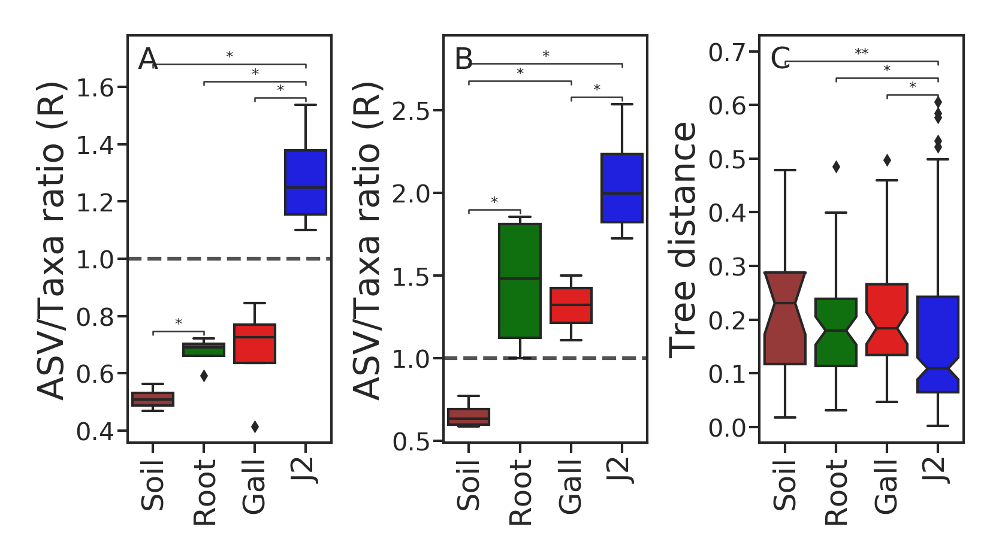

In [5]:
### Check with filtered to genera data
from scipy.stats import mannwhitneyu as mwu
from scipy.stats import wilcoxon
from statsmodels.stats.multitest import multipletests
from numpy import average
from itertools import combinations
from statannot import add_stat_annotation

#barplot of core features observed
Len_all_df  = pd.read_csv('Results/Core_Features/Core_ASV_count_filt.tsv', sep='\t')
Len_all_df7 = pd.read_csv('Results/Core_Features/Core_Taxa_count_filt.tsv',sep='\t')
bars = pd.DataFrame()
cols = [col for col in Len_all_df.columns.tolist() if '-' not in col]
for col in cols: bars[col] = Len_all_df[col]/Len_all_df7[col]
data=pd.DataFrame(columns = ['Feature','Niche'])
for col in bars.columns.tolist():
    sub = pd.DataFrame()
    sub['Feature'] = bars[col]
    sub['Niche']= col
    data = pd.concat([data, sub])

results = pd.read_csv('Results/Core_Features/Core_Distances.tsv',sep='\t',index_col=0)
sns.set(style='ticks',rc={"lines.linewidth":0.5,"axes.linewidth":0.5})

### plot
fig, axes = plt.subplots(1,3,figsize=(3,1.5),dpi=600,gridspec_kw={'wspace': 0.55})
subs,annots=['All','Unique',None],['A','B','C']
hue = {'Soil':'brown','Root':'green','Gall':'red','J2':'blue'}
for i,s in enumerate(subs):
    ax=axes[i]
    if i<2:
        subdata = data[data['Niche'].str.contains(s)]
        subdata['Niche']=subdata['Niche'].str.replace('_All','').str.replace('_Unique','')
        sns.boxplot(x='Niche',y='Feature',data=subdata,ax=ax,order=list(hue.keys()),palette=hue,fliersize=0.5)
        ax.axhline(1, c='k', linestyle='--', lw=0.75, alpha=0.75)
        ax.set_ylabel('ASV/Taxa ratio (R)',fontsize=7,labelpad=1)
    else:
        sns.boxplot(x='niche',y='treedist',data=results,order=list(hue.keys()),palette=hue,notch=True,ax=ax,fliersize=0.5)
        ax.set_ylabel('Tree distance',fontsize=7,labelpad=1)
    ax.tick_params(axis='y',labelsize=5,length=2,pad=0.5,width=0.5)
    ax.tick_params(axis='x',labelrotation=90,labelsize=6,length=2,pad=0.5,width=0.5)
    ax.set_xlabel('')
    ax.annotate(annots[i],xy=(0,1),xycoords="axes fraction",xytext=(2,-2),textcoords="offset points",ha="left",va="top",size=6)
    ax.legend(frameon=False,fontsize=6)
### stats
    niches = list(set(subdata['Niche']))
    if i < 2:
        mwu_results = pd.DataFrame(columns=['niche1','niche2','mean_ratio1','mean_ratio2','u','p'])
        for pair in combinations(niches,2):
            niche1_ratios = subdata.loc[subdata.Niche==pair[0]]['Feature'].tolist()
            niche2_ratios = subdata.loc[subdata.Niche==pair[1]]['Feature'].tolist()
            u, p = mwu(niche1_ratios,niche2_ratios)
            mean1,mean2  = average(niche1_ratios),average(niche2_ratios)
            mwu_results.loc[len(mwu_results)]=[pair[0],pair[1],mean1,mean2,u, p]          
        mwu_results['q'] = multipletests(mwu_results.p,method='fdr_bh')[1]
    else:
        mwu_results = pd.DataFrame(columns=['niche1','niche2','median1','median2','u','p'])
        for pair in combinations(['Gall','Root','Soil','J2'],2):
            u, p = mwu(results.loc[results.niche==pair[0]]['treedist'],results.loc[results.niche==pair[1]]['treedist'])
            median1 = results.loc[results.niche==pair[0]]['treedist'].squeeze().median()
            median2 = results.loc[results.niche==pair[1]]['treedist'].squeeze().median()
            mwu_results.loc[len(mwu_results)]=[pair[0],pair[1],median1,median2,u, p]
        mwu_results['q'] = multipletests(mwu_results.p,method='fdr_bh')[1]
### annotations
    x, y, df = 'Niche', 'Feature', subdata.copy()
    if i == 2: x, y, df = 'niche', 'treedist', results.copy()
    qs = {(mwu_results.iloc[j]['niche1'],mwu_results.iloc[j]['niche2']):q for j,q in enumerate(mwu_results['q']) if q < 0.05}
    add_stat_annotation(ax,data=df,x=x,y=y,box_pairs=list(qs.keys()),pvalues=list(qs.values()),linewidth=0.3,line_height=0.01,\
    fontsize=3,text_format='star',loc='inside',perform_stat_test=False,text_offset=0,line_offset=0,line_offset_to_box=0.01,)
    print(mwu_results)
plt.savefig('Results/Figures/Core_features_unique-shared_genera.png', bbox_inches='tight')

# Heatmaps Longitudinal

### Functions

In [6]:
def unpack(qzv):
    a = !unzip $qzv
    digest = a[1].split('/')[0].replace('  inflating: ','')
    data = pd.read_csv('%s/data/data.tsv'%digest,sep='\t',skiprows=[1])
    feat = pd.read_csv('%s/data/feature_metadata.tsv'%digest,sep='\t',skiprows=[1])
    !rm -r $digest
    return data,feat

def rename_Tax(TaxFull):
    Taxa = TaxFull.T
    Taxa['ID'] = Taxa.index
    Taxa['Short'] = Taxa['ID'].str.replace(';__', '').str.replace('[', '').str.replace(']', '').str.replace('.', '')\
    .str.replace('/', '_').str.replace("'", '').str.split("__").str[-1].str.split(";").str[-1]\
    .str.replace('Allorhizobium-Neorhizobium-Pararhizobium','A/N/P')
    for n in range(2,7):
        Taxa.loc[Taxa['Short'].str.contains('uncultured bacterium'),'Short'] = Taxa['ID'].str.replace(';__','').str.replace('[','')\
        .str.replace(']','').str.replace('.','').str.replace('/','_').str.replace("'",'').str.split("__").str[-n].str.split(';')\
        .str[0]+'_unc_b'
        Taxa.loc[Taxa['Short'].str.contains('uncultured'),'Short'] = Taxa['ID'].str.replace(';__','').str.replace('[','')\
        .str.replace(']','').str.replace('.','').str.replace('/','_').str.replace("'",'').str.split("__").str[-n].str.split(';')\
        .str[0]+'_unc'
    Taxa.index = Taxa.Short
    Taxa.drop(['Short', 'ID'], axis = 1, inplace=True)
    Tax = Taxa.T
    return Tax

def rename_Tax_imp(Taxa):
    Taxa['Short'] = Taxa['id'].str.replace(';__', '').str.replace('[', '').str.replace(']', '').str.replace('.', '')\
    .str.replace('/', '_').str.replace("'", '').str.split("__").str[-1].str.split(";").str[-1]\
    .str.replace('Allorhizobium-Neorhizobium-Pararhizobium','A/N/P')
    for n in range(2,7):
        Taxa.loc[Taxa['Short'].str.contains('uncultured bacterium'),'Short'] = Taxa['id'].str.replace(';__','').str.replace('[','')\
        .str.replace(']','').str.replace('.','').str.replace('/','_').str.replace("'",'').str.split("__").str[-n].str.split(';')\
        .str[0]+'_unc_b'
        Taxa.loc[Taxa['Short'].str.contains('uncultured'),'Short'] = Taxa['id'].str.replace(';__','').str.replace('[','')\
        .str.replace(']','').str.replace('.','').str.replace('/','_').str.replace("'",'').str.split("__").str[-n].str.split(';')\
        .str[0]+'_unc'
    Taxa.index = Taxa.Short
    Taxa.drop(['Short', 'id'], axis = 1, inplace=True)
    return Taxa  
outdir = 'Results/Figures/Features_volatility'

### Tables to plot, each niche as separate table.tsv

In [9]:
### Variables
important_Taxa = 15
changed_Taxa   = 5
important_ASV  = 15
changed_ASV    = 5
ASV_to_Taxa    = 2

niches = {'Gall':['2G','3G','4G','5G','6G'], 'Root':['1R','2R','3R','4R','5R','6R'],
          'J2'  :['2J','3J','4J','6J'],      'Soil':['1S','2S','3S','4S','5S','6S']}

!mkdir -p $outdir

ASV_Inf,ASV_Inf_imp = unpack('Results/Longitudinal/Infected/Feature_Volatility/Infected_volatility-plot.qzv')
Tax_Inf,Tax_Inf_imp = unpack('Results/Longitudinal/Infected/Feature_Volatility_lev-7/Infected_volatility-plot_7-lev.qzv')
ASV_Inf = ASV_Inf.rename(columns=lambda x: x.replace('Allorhizobium-Neorhizobium-Pararhizobium','A/N/P'))
ASV_Inf_imp.index = ASV_Inf_imp['id'].str.replace('Allorhizobium-Neorhizobium-Pararhizobium','A/N/P')
ASV_Inf_imp.drop(['id'], axis = 1, inplace=True)
Tax_Inf = rename_Tax(Tax_Inf)                ### reduce Taxonomy to the last known level
Tax_Inf_imp = rename_Tax_imp(Tax_Inf_imp)    ### reduce Taxonomy to the last known level
### Creating a list of features and ASVs    
for niche in niches:
    tax_list,asv_list,features = [],[],{}
    ASV,ASV_imp = unpack('Results/Longitudinal/By_Niches/%s_ASV_Feature_Volatility/%s_ASV_volatility-plot.qzv'%(niche,niche))
    Tax,Tax_imp = unpack('Results/Longitudinal/By_Niches/%s_Taxa_Feature_Volatility/%s_Taxa_volatility-plot.qzv'%(niche,niche))
    ASV = ASV.rename(columns=lambda x: x.replace('Allorhizobium-Neorhizobium-Pararhizobium','A/N/P'))
    ASV_imp.index = ASV_imp['id'].str.replace('Allorhizobium-Neorhizobium-Pararhizobium','A/N/P')
    ASV_imp.drop(['id'], axis = 1, inplace=True)
    Tax   = rename_Tax(Tax)                  ### reduce Taxonomy to the last known level
    Tax_imp = rename_Tax_imp(Tax_imp)        ### reduce Taxonomy to the last known level
### sending to list most important and most changed Taxa
    tax_list += Tax_imp.head(important_Taxa).index.tolist()
    Taxa_NAC = Tax_imp.sort_values('Net Avg Change',ascending=False)
    Taxa_NAC = pd.concat([Taxa_NAC.head(changed_Taxa).copy(),Taxa_NAC.tail(changed_Taxa).copy()],sort=True)
    tax_list += Taxa_NAC.index.tolist()
### sending to list most important and most changed ASVs
    asv_list += ASV_imp.head(important_ASV).index.tolist()
    asv_NAC = ASV_imp.sort_values('Net Avg Change',ascending=False)
    asv_NAC = pd.concat([asv_NAC.head(changed_ASV).copy(),asv_NAC.tail(changed_ASV).copy()],sort=True)
    asv_list += asv_NAC.index.tolist()
### adding corresponding to ASVs Taxa to Taxa list
    for asv in set(asv_list):
        a = asv.replace('_',' ').replace(' unc b','_unc_b').replace(' unc','_unc').split('|')[0]
        try:
            temp = Tax_imp.loc[[a]].copy()
            tax_list += temp.index.tolist()
        except:
            pass
        try:
            temp = Tax_Inf_imp.loc[[a]].copy()
            tax_list += temp.index.tolist()
        except:
            pass
    tax_list = list(set(tax_list))
    asc_list = list(set(asv_list))
### Preparing tables
    data_Tax = pd.DataFrame({'Feature':tax_list}) ### Taxonomy table
    data_Tax.set_index('Feature', inplace=True)
    for tp in niches[niche]:
        temp_Tax = Tax.loc[Tax.Group_TP == niche[:1]+'_'+tp[:1]].copy()
        for f in tax_list:
            try:
                data_Tax.at[f,tp] = temp_Tax[f].mean()
            except:
                pass
        temp_Tax = Tax_Inf.loc[Tax_Inf.Group_TP == niche[:1]+'_'+tp[:1]].copy()
        for f in tax_list:
            try:
                data_Tax.at[f,tp] = temp_Tax[f].mean()
            except:
                pass
    data_Tax.dropna(inplace=True)
### important ASVs to taxa list    
    asv_totaxa = []
    for f in data_Tax.index.tolist():
        asv_totaxa += [col for col in list(ASV) if f.replace(' ','_') in col]
        asv_totaxa += [col for col in list(ASV_Inf) if f.replace(' ','_') in col]
    asv_totaxa = list(set(asv_totaxa + asv_list))
    data_ASV = pd.DataFrame({'Feature':asv_totaxa}) ### ASV table
    data_ASV.set_index('Feature', inplace=True)
    for tp in niches[niche]:
        temp_ASV = ASV.loc[ASV.Group_TP == niche[:1]+'_'+tp[:1]].copy()
        for a in set(asv_totaxa):
            try:
                data_ASV.at[a,tp] = temp_ASV[a].mean()
            except:
                pass
        temp_ASV = ASV_Inf.loc[ASV_Inf.Group_TP == niche[:1]+'_'+tp[:1]].copy()
        for a in set(asv_totaxa):
            try:
                data_ASV.at[a,tp] = temp_ASV[a].mean()
            except:
                pass
    data_ASV.dropna(inplace=True)
    data_ASV['Max'] = data_ASV.idxmax(axis=1)
### Ordering by abundances in time-points
    data_Tax['Max'] = data_Tax.idxmax(axis=1)
    Taxon = pd.DataFrame()
    for tp in niches[niche]:
        data = data_Tax.loc[data_Tax.Max == tp].copy()
        data.sort_values(by=[tp],inplace=True,ascending=False)
        Taxon = pd.concat([Taxon,data])
### Adding and ordering ASVs from data_ASV to Taxa table and add important ASVs if they are not most in the resulting table
    Feat, ASV_venn = pd.DataFrame(), pd.DataFrame()
    for index, row in Taxon.iterrows():
        rows = pd.DataFrame()
        taxa_row = Taxon.loc[Taxon.index == index].copy()
        RA = taxa_row.mean(axis=1)
        taxa_row['RA'],taxa_row['RAn'] = RA,RA
        rows = pd.concat([rows, taxa_row])
        asv_row  = data_ASV[data_ASV.index.str.contains(index.replace(' ','_')+'|', regex=False)]
        asv_row['RA'] = asv_row.mean(axis=1)
        asv_row.sort_values('RA',ascending=False,inplace=True)
        asv_row = asv_row.head(ASV_to_Taxa)
        asv_row.drop(['RA'],axis=1,inplace=True)
        asv_row = asv_row[(asv_row[niches[niche]] != 0).any(axis=1)]
        for a in asv_list:
            if index.replace(' ','_')+'|' in a and a not in asv_row.index.tolist():
                asv_row = pd.concat([asv_row,data_ASV.loc[[a]].copy()])
        for tp in niches[niche]:
            data = asv_row.loc[asv_row.Max == tp].copy()
            data.sort_values(by=[tp],inplace=True,ascending=False)
            #data.index = data.index.str.split('|',1).str[-1].str[:8]
            data['RAn'] = data[niches[niche]].mean(axis=1)
            rows = pd.concat([rows,data],sort=True)
        for ind,row in rows.iterrows():
            rows.at[ind,'RA'] = RA
        rows['RAn']=(rows['RAn']-rows['RAn'].min())/(rows['RAn'].max()-rows['RAn'].min()) ### normalize by column RAn
        ASV_venn = pd.concat([ASV_venn,rows],sort=True)
        if len(rows.index) <= 2:
            taxa_row.at[index,'RAn'] = 1
            rows = taxa_row
        Feat = pd.concat([Feat,rows],sort=True)
    Feat = Feat[(Feat[niches[niche]] != 0).any(axis=1)]
    ASV_venn = ASV_venn[(ASV_venn[niches[niche]] != 0).any(axis=1)]
    Feat = Feat.drop(['Max'],axis=1)
    ASV_venn = ASV_venn.drop(['Max'],axis=1)
    Feat.to_csv(outdir+'/%s.tsv'%niche,sep='\t')
    ASV_venn.to_csv(outdir+'/%s_venn.tsv'%niche,sep='\t')

/home/bio/anaconda3/envs/qiime2-2019.10/lib/python3.6/site-packages/ipykernel_launcher.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/bio/anaconda3/envs/qiime2-2019.10/lib/python3.6/site-packages/ipykernel_launcher.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


### All niches as one figure but with separate y-axis (3 subplots: Gall, Root, J2) + Venn

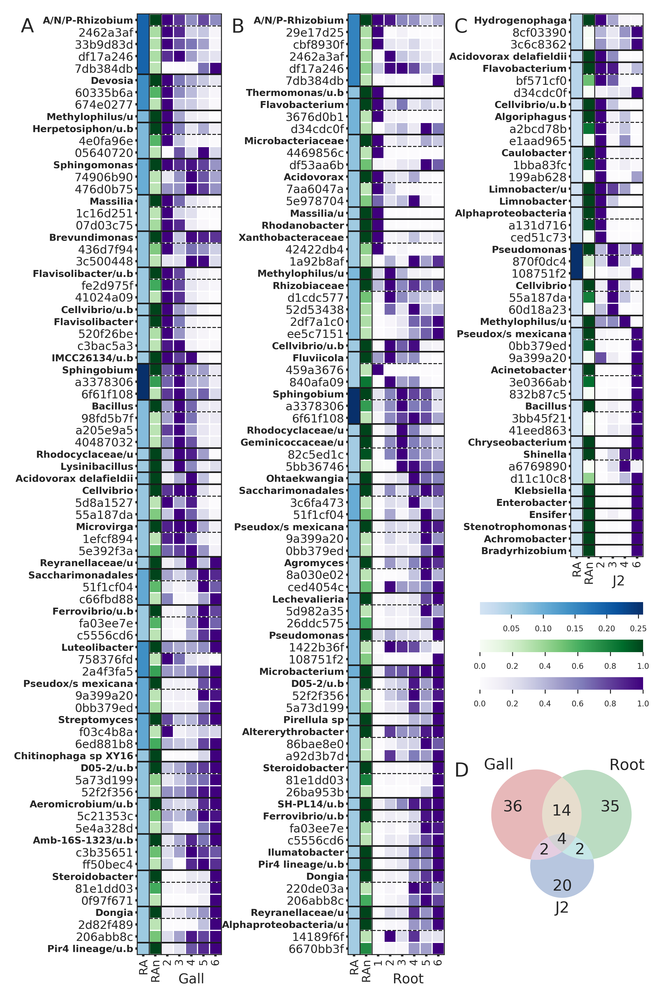

In [7]:
import matplotlib.gridspec as gridspec
from matplotlib_venn import venn3
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
niches = {'Gall':['2G','3G','4G','5G','6G'], 'Root':['1R','2R','3R','4R','5R','6R'],
          'J2'  :['2J','3J','4J','6J'],      'Soil':['1S','2S','3S','4S','5S','6S']}
fig = plt.figure(figsize=(4.7,9),dpi=600)
outer = gridspec.GridSpec(1,3, width_ratios=[7,8,6], wspace=1.5)
nich_list, i, ann = [], 0, 'ABCD'
for niche in niches:
    if niche == 'Soil':
        continue 
    data = pd.read_csv(outdir+'/%s.tsv'%niche,sep='\t',index_col=0)
    venn = pd.read_csv(outdir+'/%s_venn.tsv'%niche,sep='\t',index_col=0)
    data.index = data.index.str.replace('Pseudoxanthomonas','Pseudox/s').str.replace('_unc_b','/u.b').str.replace('_unc','/u')
    index = [i.split('|',1)[-1][:8] if '|' in i else i for i in data.index.tolist()]
    data.index = index
    norm = data.copy()
    rel, rel_n  = data[['RA']].copy(), data[['RAn']].copy()
    norm.drop(['RA','RAn'],axis=1,inplace=True)
    norm = norm.div(norm.max(axis=1),axis=0) ### normalize by rows
    norm.rename(columns=lambda x: x[:1], inplace=True)
    nich_list.append(set([a for a in venn.index.tolist() if '|' in a]))
    inner = gridspec.GridSpecFromSubplotSpec(5,3,subplot_spec=outer[i],wspace=0,hspace=0,width_ratios=[1,1,len(niches[niche])]\
                                             ,height_ratios=[len(max(nich_list,key=len)),1,1,1,len(min(nich_list,key=len))])
    i+=1                       
    ax1 = plt.Subplot(fig,inner[0:5,0])     ### RA ax1 
    ax2 = plt.Subplot(fig,inner[0:5,1])     ### RAn ax2
    ax3 = plt.Subplot(fig,inner[0:5,2])     ### tps ax3
    if niche == 'J2':
        ax1 = plt.Subplot(fig,inner[0,0])   ### RA ax1 
        ax2 = plt.Subplot(fig,inner[0,1])   ### RAn ax2
        ax3 = plt.Subplot(fig,inner[0,2])   ### tps ax3
        ax4 = plt.Subplot(fig,inner[1,0:3]) ### for cbar RA
        ax5 = plt.Subplot(fig,inner[2,0:3]) ### for cbar RAn
        ax6 = plt.Subplot(fig,inner[3,0:3]) ### for cbar tps
        ax7 = plt.Subplot(fig,inner[4,0:3]) ### Venn ax4
        for ax in [ax4,ax5,ax6,ax7]:
            fig.add_subplot(ax)
            ax.tick_params(labelsize=4,length=2,width=0.5)
        ax4.set_position([0.65, 0.4, 0.25, 0.01],which='both')
        sns.heatmap(rel,ax=ax1,square=True,cmap="Blues",xticklabels=True,yticklabels=True,center=0.1,\
                    cbar_kws={'orientation':'horizontal'},cbar_ax=ax4)
        ax5.set_position([0.65, 0.37, 0.25, 0.01],which='both')
        sns.heatmap(rel_n,ax=ax2,square=True,cmap="Greens",linewidths=0.5,xticklabels=True,yticklabels=False,\
                   cbar_kws={'orientation':'horizontal'},cbar_ax=ax5)
        ax6.set_position([0.65, 0.34, 0.25, 0.01],which='both')
        sns.heatmap(norm,ax=ax3,square=True,cmap="Purples",linewidths=0.5,xticklabels=True,yticklabels=False,\
                   cbar_kws={'orientation':'horizontal'},cbar_ax=ax6)
        v3 = venn3(nich_list,ax=ax7,set_labels=('Gall','Root','J2'))
        for text in v3.set_labels:    text.set_fontsize(8)
        for text in v3.subset_labels: text.set_fontsize(8)
        ax7.set_position([0.65, 0.1, 0.25, 0.25],which='both')
        ax7.annotate(ann[3],xy=(-0.18,1),xycoords="axes fraction",xytext=(2,-2),textcoords="offset points",ha="left",va="top",size=10)
    else:
        sns.heatmap(rel,ax=ax1,cbar=False,square=True,cmap="Blues",xticklabels=True,yticklabels=True,center=0.02)   
        sns.heatmap(rel_n,ax=ax2,cbar=False,square=True,cmap="Greens",linewidths=0.5,xticklabels=True,center=0.3,yticklabels=False)     
        sns.heatmap(norm,ax=ax3,cbar=False,square=True,cmap="Purples",linewidths=0.5,xticklabels=True,yticklabels=False)
    ax1.annotate(ann[i-1],xy=(-10,1),xycoords="axes fraction",xytext=(2,-2),textcoords="offset points",ha="left",va="top",size=10)
    ax3.set_xlabel(niche,fontsize=8)
### add lines to separate by Taxa and asvs
    taxa_lines,asv_lines = [],[1,] 
    index_list = data.index.tolist()
    for index in index_list:
        if index[:1].isupper() == True and index_list.index(index) > 0:      ### taxa starts with upper
            taxa_lines.append(index_list.index(index))
            asv_lines.append(index_list.index(index)+1)
    ax2.hlines(asv_lines, *ax2.get_xlim(),linestyles='dashed',linewidth=0.5) ### add lines to separate ASVs
    ax3.hlines(asv_lines, *ax3.get_xlim(),linestyles='dashed',linewidth=0.5) ### add lines to separate ASVs
### adjust all axes in loop
    axes = [ax1,ax2,ax3]
    for ax in axes:
        ax.hlines(taxa_lines,*ax.get_xlim(),linewidth=0.8)                   ### add lines to separate by Taxa and ASVs
        ax.set_anchor('N')                                                   ### align subplots to the top of the figure
        ax.yaxis.set_label_text("")                                          ### remove y-axis label
        ax.tick_params(axis='x',labelrotation=90)                            ### rotate x-axis tick-lables
        ax.tick_params(axis='both',which='major',labelsize=6,length=1,pad=1) ### adjust ticks and tick-labels
        for _, spine in ax.spines.items():
            spine.set_visible(True)                                          ### add lines around the heatmaps as subplots
        fig.add_subplot(ax)
    plt.tick_params(axis='both',labelsize=5.5,length=1,pad=1)
    plt.xlabel(niche,fontsize=7)
    for feat in ax1.get_yticklabels():  ### making taxa bold
        f =  feat.get_text()
        if f[:1].isupper() == True:     ### taxa starts with upper
            feat.set_weight('semibold')
            feat.set_fontsize(5)
plt.savefig(outdir+'/Gall-Root-J2_heatmap_venn.png', bbox_inches='tight')

# Features volatility plots

### Functions

In [4]:
def unpack(qzv):
    a = !unzip $qzv
    digest = a[1].split('/')[0].replace('  inflating: ','')
    data = pd.read_csv('%s/data/data.tsv'%digest,sep='\t',skiprows=[1])
    feat = pd.read_csv('%s/data/feature_metadata.tsv'%digest,sep='\t',skiprows=[1])
    !rm -r $digest
    return data, feat

def feat_vol_Taxa(taxa, asv, data_tax, data_asv):
    features = [taxa[0]] + sorted(list(set(taxa[1:]+asv)))
    lines, hue = ['Soil','Root','J2','Gall'], {'Soil':'brown','Root':'green','J2':'blue','Gall':'red'}
    outdir = 'Results/Figures/Features_volatility/Infected/Taxa'
    sns.set(style='ticks',rc={"lines.linewidth":0.7,"axes.linewidth":0.5})
    taxcol,asvcol = [],[]
    for feature in features:
        taxcol += [col for col in list(data_tax) if feature == col]
        asvcol += [col for col in list(data_asv) if feature == col]
    data_tax = data_tax.loc[data_tax['TP'].isin(order)].sort_values('TP')
    data_asv = data_asv.loc[data_asv['TP'].isin(order)].sort_values('TP')
    nrows,ncols = 1,1
    if len(taxcol+asvcol)>=4: ncols=2
    if len(taxcol+asvcol)>=9: ncols=3
    if len(taxcol+asvcol)>=12:ncols=4
    nrows=math.ceil(len(taxcol+asvcol)/ncols)
    w=ncols                          #width of the figure
    if ncols>1: w=ncols+ncols*0.25   #ncols*0.25 and nrows*0.1 to adjust figsize gridspec_kw={'hspace':0.1,'wspace':0.25} below
    h=nrows*0.4 + nrows*0.1          #height of the figure
    i,x,y=0,0,0
    fig, axes = plt.subplots(nrows,ncols,dpi=600,figsize=(w,h),sharex=True,gridspec_kw={'hspace':0.1,'wspace':0.25})
    for asv in sorted(taxcol+asvcol):
        y, a, data = i, asv, data_tax
        if '|' in asv: a, data = asv.split('|')[0]+'\n'+asv.split('|')[1][:9], data_asv
        if i>nrows-1:     x,y = 1, i-nrows
        if i>(nrows*2-1): x,y = 2, i-nrows*2
        if i>(nrows*3-1): x,y = 3, i-nrows*3
        if ncols==1:      ax=axes[i]
        if ncols>1:       ax=axes[y][x]
        sns.lineplot(y=asv,x='TP',data=data,ax=ax,hue='Niche',err_style="bars",err_kws={'capsize':1},legend=False,ci=67,palette=hue)
        ax.tick_params(axis='both',pad=0,length=1,labelsize=3.5,width=0.5)
        ax.set_xlabel('')
        ax.set_ylabel('')
        annot = a.replace('Allorhizobium-Neorhizobium-Pararhizobium','A/N/P').replace('Pseudoxanthomonas','Pseudox/s')
        ax.annotate(annot,xy=(0,1),xycoords="axes fraction",xytext=(3,-1),textcoords="offset points",ha="left",va="top",size=4)            
        i+=1
    if len(fig.axes) > len(taxcol+asvcol): #remove empty axes from the figure
        for n in range(len(fig.axes)-len(taxcol+asvcol)):
            axes[nrows-1-n][ncols-1].set_visible(False)
    fig.align_ylabels(axes[:len(taxcol+asvcol)])
    fig.legend(lines,labels=lines,loc=9,fontsize=4,ncol=4,columnspacing=0.1,frameon=False,numpoints=2,
               handletextpad=0,bbox_to_anchor=(0.5,0.1),bbox_transform=plt.gcf().transFigure)
    plt.savefig('Results/Figures/Features_volatility/Taxa_list_%s.png'%taxa[0], bbox_inches='tight')
    plt.show() 

order = ['1_tp','2_tp','3_tp','4_tp','5_tp','6_tp']

### Collapse, convert to rel. ab. table, export biom table to tsv

In [59]:
tabin = 'Data/tables/Infected_table.qza'
table = 'Data/tables/Inf_taxa_table.qza'  
tax_r = 'Data/tables/Inf_taxa_rel_table.qza'
asv_r = 'Data/tables/Infected_relative_table.qza'

!qiime taxa collapse \
    --i-table $tabin \
    --i-taxonomy Data/combo_taxonomy.qza \
    --p-level 7 \
    --o-collapsed-table $table
!qiime feature-table relative-frequency \
    --i-table $table \
    --o-relative-frequency-table $tax_r
!qiime feature-table relative-frequency \
    --i-table $tabin \
    --o-relative-frequency-table $asv_r
!qiime tools export \
    --input-path $tab_r \
    --output-path Results/Longitudinal/Biom_tax
!qiime tools export \
    --input-path $asv_r \
    --output-path Results/Longitudinal/Biom_asv
!biom convert -i Results/Longitudinal/Biom_tax/feature-table.biom -o Results/Longitudinal/Biom_tax/feature-table.tsv --to-tsv
!biom convert -i Results/Longitudinal/Biom_asv/feature-table.biom -o Results/Longitudinal/Biom_asv/feature-table.tsv --to-tsv

Saved FeatureTable[Frequency] to: Data/tables/Inf_taxa_table.qza
Saved FeatureTable[RelativeFrequency] to: Data/tables/Inf_taxa_rel_table.qza
Saved FeatureTable[RelativeFrequency] to: Data/tables/Infected_relative_table.qza
Exported Data/tables/Inf_taxa_rel_table.qza as BIOMV210DirFmt to directory Results/Longitudinal/Biom_tax
Exported Data/tables/Infected_relative_table.qza as BIOMV210DirFmt to directory Results/Longitudinal/Biom_asv


### Combine metadata and biom tsv

In [4]:
#Taxa
biom_df = pd.read_csv('Results/Longitudinal/Biom_tax/feature-table.tsv', sep='\t', skiprows=1)
biom_df['Combo'] = pd.DataFrame(biom_df['#OTU ID'].astype(str).str.replace(';__', '').str.replace('[', '').str.replace(']', '').str.replace('.', '')\
                                .str.replace('/', '_').str.replace("'", '').str.split("__").str[-1].str.split(";").str[-1])
for n in range(2,7):
    biom_df.loc[biom_df['Combo'].str.contains('uncultured_bacterium'),'Combo'] = biom_df['#OTU ID'].astype(str).str.replace(';__','').str.replace('[','')\
    .str.replace(']','').str.replace('.','').str.replace('/','_').str.replace("'",'').str.split("__").str[-n].str.split(';').str[0]+'_unc_b'
    biom_df.loc[biom_df['Combo'].str.contains('uncultured'),'Combo'] = biom_df['#OTU ID'].astype(str).str.replace(';__','').str.replace('[','')\
    .str.replace(']','').str.replace('.','').str.replace('/','_').str.replace("'",'').str.split("__").str[-n].str.split(';').str[0]+'_unc'
biom_df.set_index('Combo',inplace=True)

meta = pd.read_csv('Metadata/metadata.tsv', sep='\t', index_col=0)
data = meta.drop(columns=['BarcodeSequence','LinkerPrimerSequence'])

for col in set(biom_df.index.tolist()):
    for index, row in data.iterrows():
        try:    data.loc[index,col] = biom_df.loc[col,index].mean()
        except: pass
data.to_csv('Results/Longitudinal/Biom_tax/rel_abund_infected.tsv',sep='\t')

In [2]:
#asv
biom_df = pd.read_csv('Results/Longitudinal/Biom_asv/feature-table.tsv', sep='\t', skiprows=1)
biom_df.set_index('#OTU ID',inplace=True)
meta = pd.read_csv('Metadata/metadata.tsv', sep='\t', index_col=0)
data = meta.drop(columns=['BarcodeSequence','LinkerPrimerSequence'])

for col in set(biom_df.index.tolist()):
    for index, row in data.iterrows():
        try:    data.loc[index,col] = biom_df.loc[col,index].mean()
        except: pass
data.to_csv('Results/Longitudinal/Biom_asv/rel_abund_infected.tsv',sep='\t')

### Plot features from Venn

/home/bio/anaconda3/envs/qiime2-2019.10/lib/python3.6/site-packages/ipykernel_launcher.py:50: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.


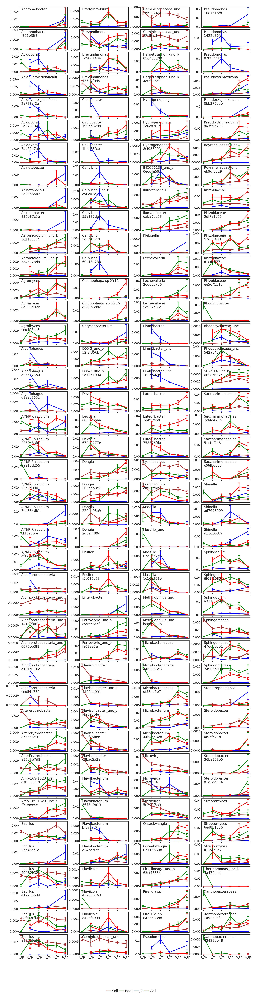

In [7]:
data_tax = pd.read_csv('Results/Longitudinal/Biom_tax/rel_abund_infected.tsv', sep='\t', index_col=0)
data_asv = pd.read_csv('Results/Longitudinal/Biom_asv/rel_abund_infected.tsv', sep='\t', index_col=0)
outdir = 'Results/Figures/Features_volatility'
niches = {'Gall':['2G','3G','4G','5G','6G'], 'Root':['1R','2R','3R','4R','5R','6R'],
          'J2'  :['2J','3J','4J','6J'],      'Soil':['1S','2S','3S','4S','5S','6S']}
taxa, asv = ['from_heatmap'], []
for niche in niches:
    if niche == 'Soil': continue 
    venn = pd.read_csv(outdir+'/%s_venn.tsv'%niche,sep='\t',index_col=0)
    for f in venn.index.tolist():
        if '|' in f: asv.append(f.replace('A/N/P','Allorhizobium-Neorhizobium-Pararhizobium'))
        else: taxa.append(f.replace('A/N/P','Allorhizobium-Neorhizobium-Pararhizobium')) 
feat_vol_Taxa(taxa, asv, data_tax, data_asv)

/home/bio/anaconda3/envs/qiime2-2019.10/lib/python3.6/site-packages/ipykernel_launcher.py:50: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.


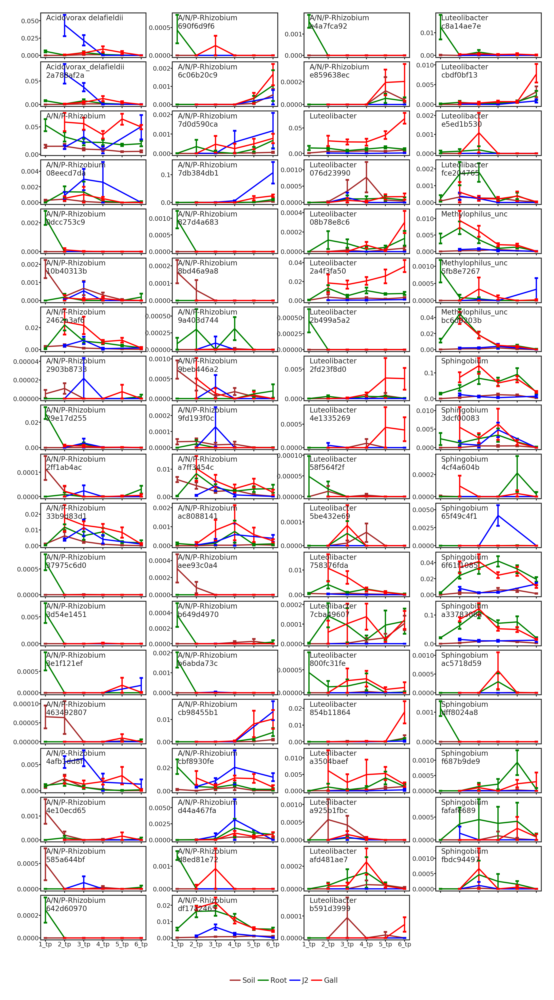

In [6]:
data_tax = pd.read_csv('Results/Longitudinal/Biom_tax/rel_abund_infected.tsv', sep='\t', index_col=0)
data_asv = pd.read_csv('Results/Longitudinal/Biom_asv/rel_abund_infected.tsv', sep='\t', index_col=0)
taxa, asv = ['Methylophilus_unc','Sphingobium','Acidovorax delafieldii','Luteolibacter','Allorhizobium-Neorhizobium-Pararhizobium-Rhizobium'],[]
for t in taxa:
    for a in data_asv.columns.tolist():
        if t.replace(' ','_')+'|' in a: asv.append(a)
taxa = ['curated_all'] + taxa
feat_vol_Taxa(taxa, asv, data_tax, data_asv)

/home/bio/anaconda3/envs/qiime2-2019.10/lib/python3.6/site-packages/ipykernel_launcher.py:50: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.


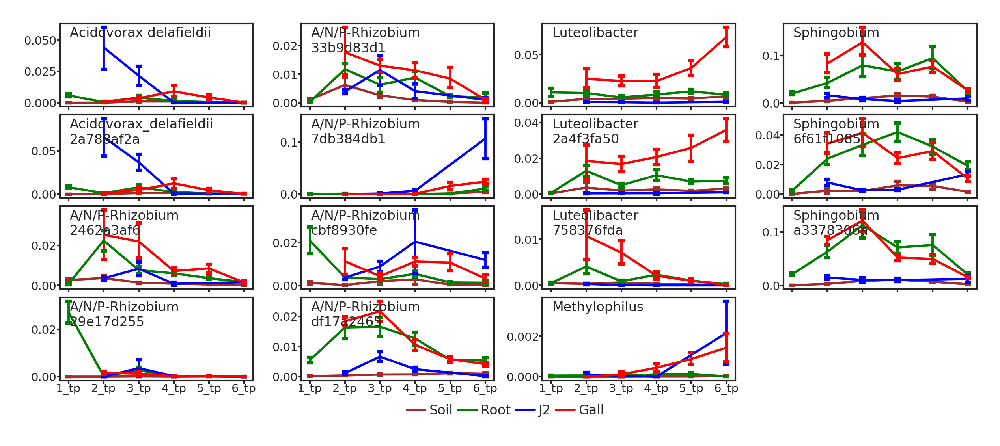

In [32]:
data_tax = pd.read_csv('Results/Longitudinal/Biom_tax/rel_abund_infected.tsv', sep='\t', index_col=0)
data_asv = pd.read_csv('Results/Longitudinal/Biom_asv/rel_abund_infected.tsv', sep='\t', index_col=0)
outdir = 'Results/Figures/Features_volatility'
niches = {'Gall':['2G','3G','4G','5G','6G'], 'Root':['1R','2R','3R','4R','5R','6R'],
          'J2'  :['2J','3J','4J','6J'],      'Soil':['1S','2S','3S','4S','5S','6S']}
taxa, asv = ['Methylophilus','Sphingobium','Acidovorax delafieldii','Luteolibacter','A/N/P-Rhizobium'],[]
for niche in niches:
    if niche == 'Soil': continue 
    venn = pd.read_csv(outdir+'/%s_venn.tsv'%niche,sep='\t',index_col=0)
    for t in taxa:
        for a in venn.index.tolist():
            if t.replace(' ','_')+'|' in a: asv.append(a.replace('A/N/P','Allorhizobium-Neorhizobium-Pararhizobium'))
taxa = ['curated_from_heatmap'] + taxa
feat_vol_Taxa(taxa, asv, data_tax, data_asv)

### Importance and average change plots ASV, taxa together

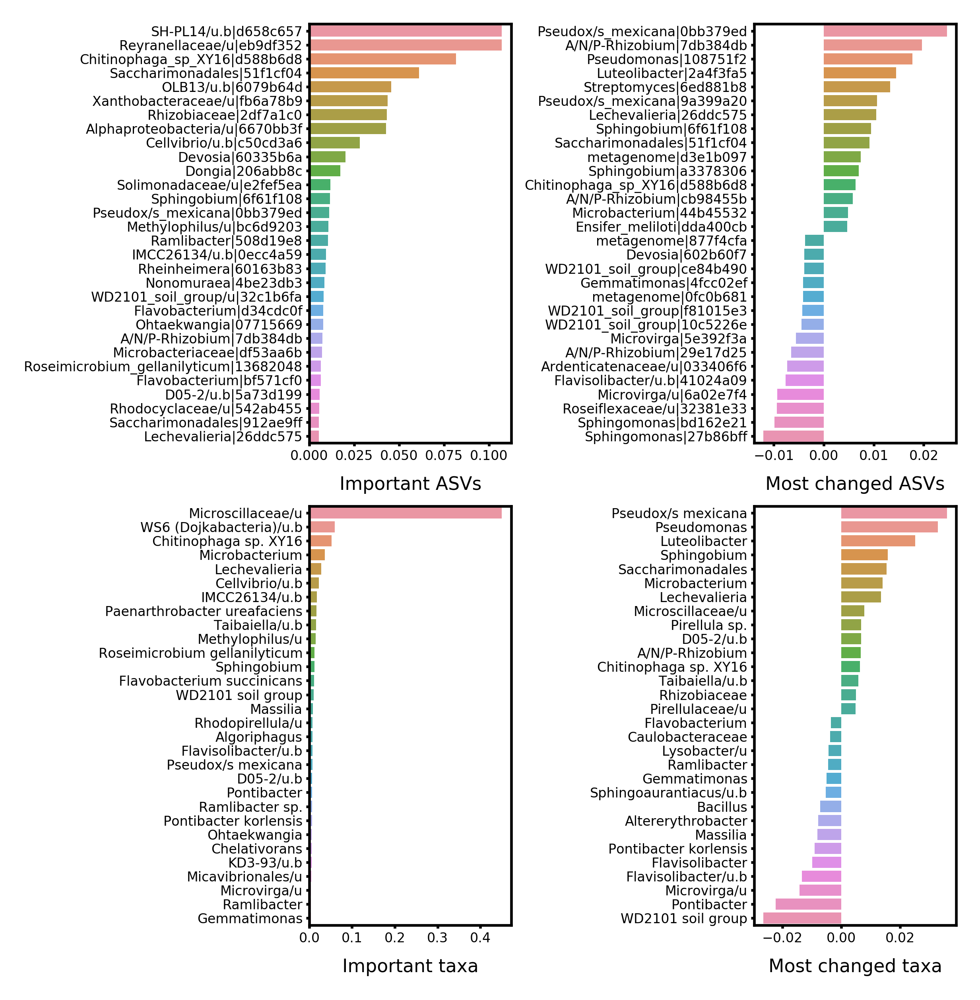

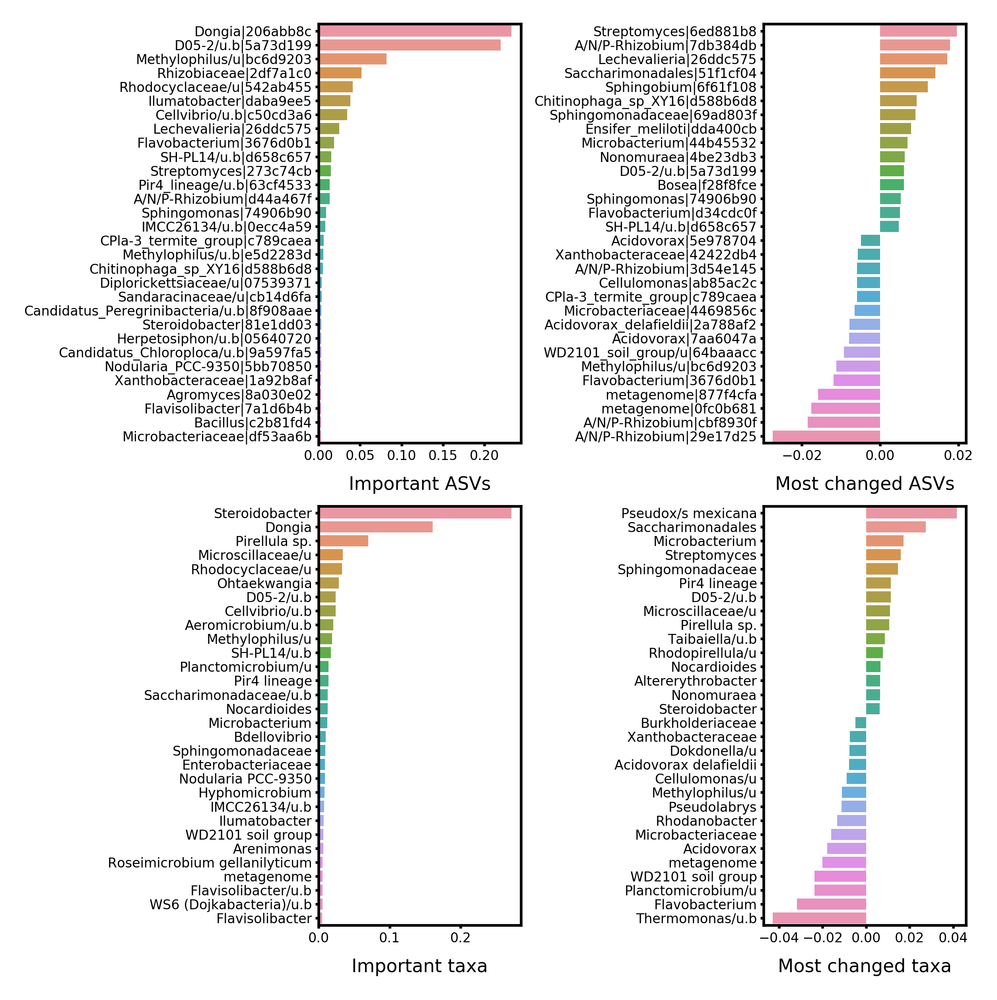

In [38]:
variants=['Infected','Root-Gall']
levels  =['ASV','lev-7']
axs=[0,0,0,1,1,0,1,1]
labels = ['Important ASVs','Most changed ASVs','Important taxa','Most changed taxa']
for var in variants:
    outdir = 'Results/Figures/Features_volatility/'
    !mkdir -p $outdir
    fig, axes = plt.subplots(2,2,figsize=(3.5,5),dpi=600,gridspec_kw={'hspace':0.15,'wspace':1.2})
    i,l=0,0
    for level in levels:
        data, feat = unpack('Results/Longitudinal/%s/Feature_Volatility/%s_volatility-plot.qzv'%(var,var))
        if level=='lev-7':
            data, feat = unpack('Results/Longitudinal/%s/Feature_Volatility_lev-7/%s_volatility-plot_7-lev.qzv'%(var,var))
        cols = ['importance','Net Avg Change']
        for col in cols:
            feat = feat.sort_values(col,ascending=False)
            plot = feat.head(30).copy()
            if col == 'Net Avg Change':
                plot=pd.concat([feat.head(15),feat.tail(15)])
            plot['short_id']=plot['id'].str.replace('Allorhizobium-Neorhizobium-Pararhizobium','A/N/P')\
            .str.replace('Pseudoxanthomonas','Pseudox/s').str.replace('_unc_b','/u.b').str.replace('_unc','/u').str[:-24]
            if level=='lev-7':
                plot['short_id']=plot['id'].str.replace('Allorhizobium-Neorhizobium-Pararhizobium','A/N/P')\
                .str.replace('Pseudoxanthomonas','Pseudox/s').str.replace(';__','').str.split('__').str[-1]
                for n in range(2,7):
                    plot.loc[plot['short_id'].str.contains('uncultured bacterium'),'short_id'] = plot['id'].str.split('__').str[-n].str.split(';').str[0]+'/u.b'
                    plot.loc[plot['short_id'].str.contains('uncultured'),'short_id'] = plot['id'].str.split('__').str[-n].str.split(';').str[0]+'/u'
                    #plot = plot[plot.short_id != 'Microscillaceae unc'] # Unassigned bacteria"""
            ax=axes[axs[i]][axs[i+1]]
            sns.barplot(y='short_id',x=col,data=plot,ax=ax)
            i+=2
            ax.tick_params(axis='both',labelsize=4,length=1,pad=1)
            ax.set_ylabel('')
            ax.set_xlabel('%s'%labels[l],fontsize=5.5)
            l+=1
    plt.savefig(outdir+'/%s_together.png'%var, bbox_inches='tight')

# Attraction assay

      M1     M2    mean_1    mean_2     u         p         q
0     <3  3-100  5.444444  3.222222  17.5  0.022173  0.026608
1     <3   >100  5.444444  0.666667   0.0  0.000150  0.000901
2     <3      F  5.444444  1.888889   6.0  0.001170  0.003337
3  3-100   >100  3.222222  0.666667   9.0  0.001669  0.003337
4  3-100      F  3.222222  1.888889  33.0  0.261675  0.261675
5   >100      F  0.666667  1.888889  13.5  0.006684  0.010026
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

<3 v.s. 3-100: Custom statistical test, , P_val=2.661e-02
3-100 v.s. >100: Custom statistical test, , P_val=3.337e-03
>100 v.s. F: Custom statistical test, , P_val=1.003e-02
<3 v.s. >100: Custom statistical test, , P_val=9.006e-04
<3 v.s. F: Custom statistical test, , P_val=3.337e-03


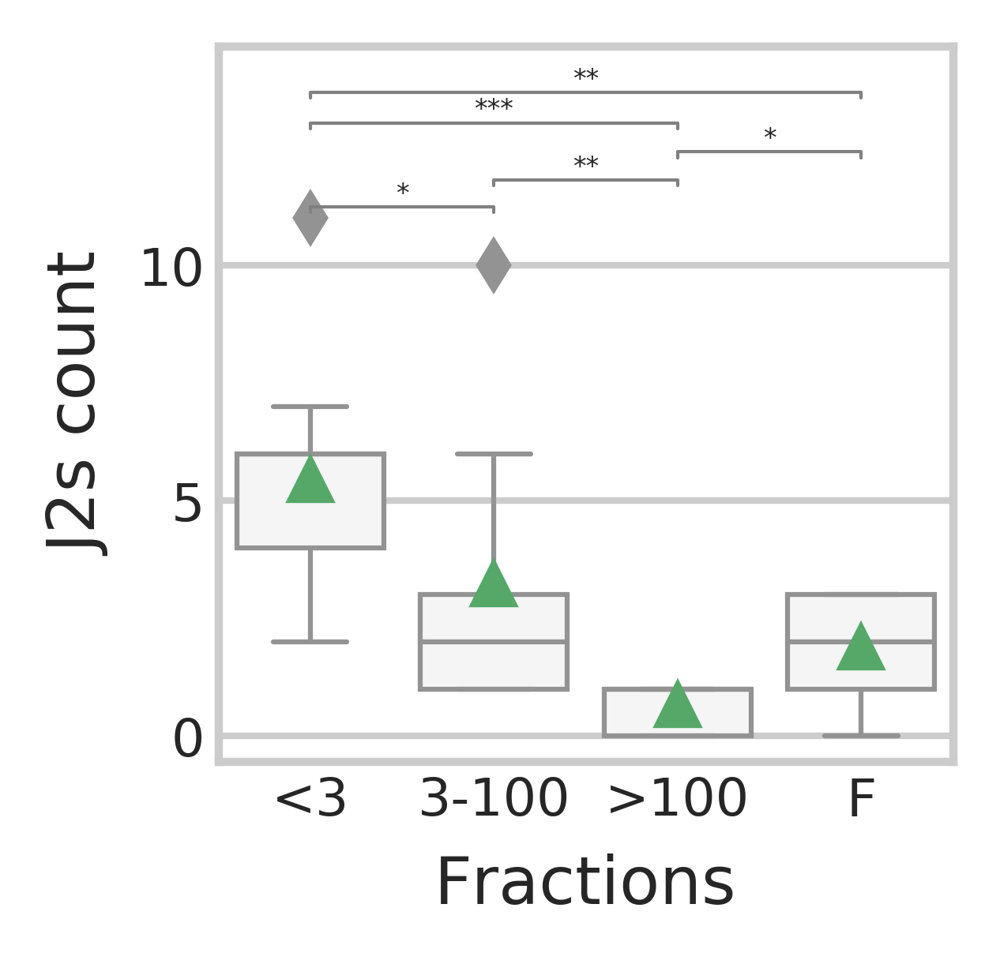

In [23]:
from scipy.stats import mannwhitneyu as mwu
from scipy.stats import wilcoxon
from statsmodels.stats.multitest import multipletests
from numpy import average
from itertools import combinations
from statannot import add_stat_annotation
sns.set(style='whitegrid')
fig, ax = plt.subplots(figsize=(2,2),dpi=600)
data = pd.read_csv('Results/Figures/Attraction/Fractions.tsv', sep='\t', index_col=0)
sns.boxplot(data=data,linewidth=0.75,showmeans=True,color='whitesmoke',)
ax.tick_params(axis='both',labelsize=8,length=2,pad=0.1)
ax.set_ylabel('J2s count',fontsize=10)
ax.set_xlabel('Fractions',fontsize=10)
### Statistics mannwhitneyu 
mwu_res = pd.DataFrame(columns=['M1','M2','mean_1','mean_2','u','p'])
for pair in combinations(data.columns,2):
    u, p = mwu(data[pair[0]].tolist(),data[pair[1]].tolist())
    mean1,mean2  = average(data[pair[0]].tolist()),average(data[pair[1]].tolist())
    mwu_res.loc[len(mwu_res)]=[pair[0],pair[1],mean1,mean2,u, p]          
mwu_res['q'] = multipletests(mwu_res.p,method='fdr_bh')[1]
print(mwu_res)

### annotations
pairs = [()]
qs = {(mwu_res.iloc[j]['M1'],mwu_res.iloc[j]['M2']):q for j,q in enumerate(mwu_res['q']) if q < 0.05}
add_stat_annotation(ax,data=data,box_pairs=list(qs.keys()),pvalues=list(qs.values()),linewidth=0.5,line_height=0.01,color='0.5',\
                    fontsize=4,text_format='star',loc='inside',perform_stat_test=False,text_offset=0,line_offset=0,line_offset_to_box=0.01,)

plt.savefig('Results/Figures/Attraction/Fractions.png', bbox_inches='tight')

# Three Rhizobiales in the gall hitmap. Where were they isolated or sequenced from?

### Check genbank isolation sources for Amb-16S-1323

In [4]:
records = SeqIO.parse('Data/Silva/arb-silva.de_2020-01-23_id772533_tax_silva.fasta','fasta')
from Bio import Entrez
Entrez.email = "timanix@yahoo.com"
genbank = []
for i in records:
    handle = Entrez.efetch(db="nucleotide", id=i.id.split('.')[0], rettype="gb", retmode="text")
    genbank.append(SeqIO.read(handle,'gb'))
    handle.close()

keys = set()
for r in genbank:
    for key in r.features[0].qualifiers.keys():
        keys.add(key)
        
qualifiers = pd.DataFrame()

for r in genbank:
    for key in r.features[0].qualifiers.keys():
        qualifiers.at[r.id,key] = r.features[0].qualifiers[key][0]
        
Amb_16S_1323 = qualifiers

### Check genbank isolation sources for Devosia

In [6]:
records = SeqIO.parse('Data/Silva/arb-silva.de_2020-01-26_id773261_tax_silva.fasta','fasta')
from Bio import Entrez
Entrez.email = "timanix@yahoo.com"
genbank = []
for i in records:
    handle = Entrez.efetch(db="nucleotide", id=i.id.split('.')[0], rettype="gb", retmode="text")
    genbank.append(SeqIO.read(handle,'gb'))
    handle.close()

keys = set()
for r in genbank:
    for key in r.features[0].qualifiers.keys():
        keys.add(key)
        
qualifiers = pd.DataFrame()

for r in genbank:
    for key in r.features[0].qualifiers.keys():
        qualifiers.at[r.id,key] = r.features[0].qualifiers[key][0]
        
devosia = qualifiers

### Check genbank isolation sources for Allorhizobium-Neorhizobium-Pararhizobium-Rhizobium¶

In [7]:
records = SeqIO.parse('Data/Silva/arb-silva.de_2020-01-26_id773263_tax_silva.fasta','fasta')
from Bio import Entrez
Entrez.email = "timanix@yahoo.com"
genbank = []
for i in records:
    handle = Entrez.efetch(db="nucleotide", id=i.id.split('.')[0], rettype="gb", retmode="text")
    try:
        genbank.append(SeqIO.read(handle,'gb'))
    except:
        pass
    handle.close()

keys = set()
for r in genbank:
    for key in r.features[0].qualifiers.keys():
        keys.add(key)
        
qualifiers = pd.DataFrame()

for r in genbank:
    for key in r.features[0].qualifiers.keys():
        qualifiers.at[r.id,key] = r.features[0].qualifiers[key][0]
        
allo = qualifiers

### Categorise isolation sources

In [8]:
def pool_sources(string):
    if isinstance(string,float):
        return string
    nodule = any([i in string for i in  ['nodule','Nodule'] ])
    root = any([i in string for i in  ['root','Root','ROOT']])
    rhizosphere = any([i in string for i in  ['rhizosphere','RHIZOSPHERE','rhizobia','rhizoplane'] ])
    plant = any([i in string for i in  ['alfalfa','leaf','plant','Plant','PLANT','hyllosphere','leaves','shoot','xylem',
               'rice','stem','poplar','mulberry','tree','grass','seed','SEED','Seed','forest','Leaves','Lemna','cormus','tuber','cucumber','yarrow']])
    plant_tumor_or_gall = any([i in string for i in  ['gall','Gall','tumor']])
    soil = any([i in string for i in  ['soil','meadow','gricultur','Soil','sandstone','sand']])
    coal_cave_stone = any([i in string for i in  ['Cave','Mine','mine','cave','stone','coal']])
    space_center = any([i in string for i in  ['pace cent','pace Cent','spacecraft']])
    water = any([i in string for i in  ['reservoir','water','Sea','sea','Lake','well','spring','river','Spring','marine']])
    sediment = any([i in string for i in ['ediment']])
    decompose = any([i in string for i in ['sludge','compost','decompos','dump','pit mud','wetland','waste','peatland']])
    skin = any([i in string for i in  ['skin','Skin']])
    gi_tract = any([i in string for i in  ['GI tract','gut','gastrointestinal','rumen','digestive','feces','intestin']])
    animal_host =  any([i in string for i in  ['earthworm','amphibian','artemia','blood','arthropod','tapetum','vagina','ant']])
    unknown =  any([i in string for i in  ['unknown','not known','Unknown','Not known']])
    anaerobic_reactor = any([i in string for i in  ['naerob']])
    
    if space_center:
        return 'Sapce center'
    elif soil:
        return 'soil'
    elif coal_cave_stone:
        return 'cave, stone, coal'
    elif nodule:
        return 'nodule'
    elif nodule:
        return 'nodule'
    elif root:
        return 'root'
    elif rhizosphere:
        return 'rhizosphere'
    elif plant:
        return 'plant'
    elif plant_tumor_or_gall:
        return 'gall or tumor'
    elif water:
        return 'water'
    elif sediment:
        return 'sediment'
    elif decompose:
        return 'decomposition'#'dump, compost, sludge, wetland or pit mud'
    elif skin:
        return 'skin'
    elif gi_tract:
        return 'gut'
    elif animal_host:
        return 'animal host'
    elif unknown:
        return 'unknown'
    elif anaerobic_reactor:
        return 'anaerobic reactor'
    return 'other'

allo['pooled_isolation_source'] = allo.isolation_source.apply(pool_sources)
allo.to_csv('Results/Figures/piecharts/allo.tsv',sep='\t',index=False)
devosia['pooled_isolation_source'] = devosia.isolation_source.apply(pool_sources)
devosia.to_csv('Results/Figures/piecharts/devosia.tsv',sep='\t',index=False)
Amb_16S_1323['pooled_isolation_source'] = Amb_16S_1323.isolation_source.apply(pool_sources)
Amb_16S_1323.to_csv('Results/Figures/piecharts/Amb_16S_1323.tsv',sep='\t',index=False)

### Plot isolation source: "late" Rhizobiales (Amb) is not a plant bacterium and has anaerobic members

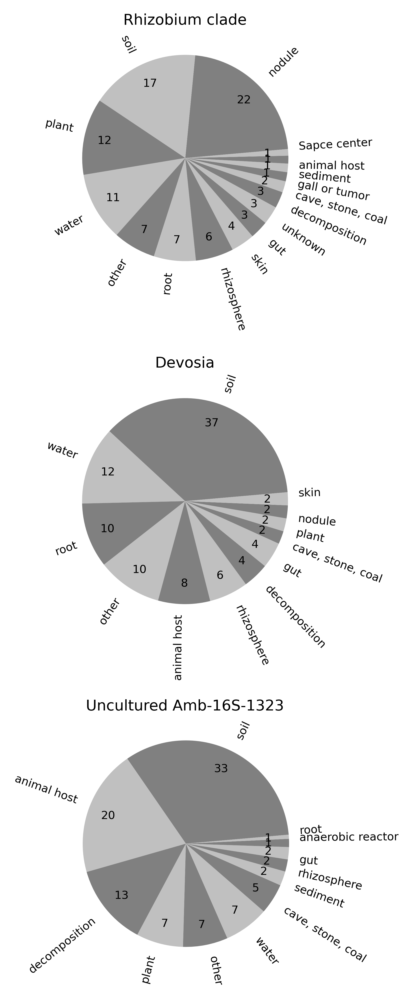

In [41]:
clades = {'Rhizobium clade':'allo.tsv','Devosia':'devosia.tsv','Uncultured Amb-16S-1323':'Amb_16S_1323.tsv'}
fig, axes = plt.subplots(3,1,figsize=(3,9),dpi=600,gridspec_kw={'hspace': 0.5})
for i,c in enumerate(clades):
    df = pd.read_csv('Results/Figures/piecharts/'+clades[c], sep='\t', index_col=0)
    counter = sorted(Counter(df.pooled_isolation_source.dropna()).items(), key=lambda i: i[1],reverse=True)
    labels = [i[0] for i in counter]
    sizes =  [i[1] for i in counter]
    ax=axes[i]
    plt.rcParams['font.size'] = 6.0
    ax.pie(sizes,startangle=5,labels=labels,rotatelabels=True,colors=cycle(['gray','silver']),autopct='%1.0f',pctdistance=0.8)
    ax.set_title(c,fontsize=8,pad=10)
    ax.axis('equal')
fig.savefig('Results/Figures/piecharts/piecharts.png',bbox_inches='tight')